In [1]:
import lightkurve as lk
import numpy as np
import pandas as pd
import glob
from astropy.io import ascii
from astropy.table import Table, join
from astropy.io import fits
import matplotlib.pyplot as plt


# useful functions

In [2]:
#og
def plot_sector(tic):
    sectors = [1,2,3,4,5,6,7,8,9,10,11,12,13]
    for sec in sectors:
        try:
            lcsectorpath = 'data/SECONDRUN/cleaned_LightCurves/{}/sector{}_lc.fits'.format(tic,sec)
            lcfile = lk.open(lcsectorpath)
            lcfile.scatter()
            plt.title('TIC:{},sector:{}'.format(tic,sec))
        except:
            print('nothing for tic:{} sector:{}'.format(tic,sec))

In [10]:
#remix---only does 1st sector from every tic
def plot_1sector(tic):
    sectors = [1,2,3,4,5,6,7,8,9,10,11,12,13]
    count = 0
    for sec in sectors:
        lcsectorpaths = 'data/SECONDRUN/cleaned_LightCurves/{}/sector{}_lc.fits'.format(tic,sec)
        if count % 2 == 0:
            try:
                lcfile = lk.open(lcsectorpaths)
                lcfile.scatter()
                plt.title('TIC:{},sector:{}'.format(tic,sec))
                count +=1
            except FileNotFoundError:
                #print('nothing for tic:{} sector:{}'.format(tic,sec))
                count +=2
        else:
            continue

In [3]:
# unique item finder

def uniquefinder(mylist):
    seen = {}
    dupes = []
    uniq_tics = []
    for x in mylist:
        if x not in seen:
            seen[x] = 1
            uniq_tics.append(x)
        else:
            if seen[x] == 1:
                dupes.append(x)
            seen[x] += 1
    uniques = len(uniq_tics)
    print('there are {} unique tics. Use the first output dictionary'.format(uniques), \
          'to see number of occurances for duplicates')
    return seen, uniq_tics

In [4]:
#useful fcn - compares lists & returns what didnt match
def returnNotMatches(a, b):
    return [[x for x in a if x not in b], [x for x in b if x not in a]] #not in b , not in a

In [5]:
#tests to make above plots a function

def sector_overlay(sector,log=True,x=None):
    """
    Args:
        sector: sector number (integer)
        log:    True(default); False linear
        x:      plotting range for x axis (tuple)
    """
    secstats = ascii.read('data/bigstats_by_sector.fits') #og/add/ext tics
    mq = pd.read_csv('data/mcquillan_sample.csv') #mq data for comparisons
    sectable = secstats[secstats['sector']==sector]
    plt.figure(figsize=(10,5),dpi=200)
    plt.scatter(sectable['Teff'],sectable['ls1'],s=.5,c=sectable['lsamp1'],vmax=1,vmin=.0001, rasterized=True);
    plt.scatter(mq['TEMP'],mq['ROTATION_PERIOD'],s=.5,vmax=1,vmin=.0001,zorder=0,color = 'grey', rasterized=True)#label='mcquillan is blue');
    plt.xlabel('$\mathrm{T_{eff}}$',fontsize=15);
    plt.ylabel("$\mathrm{Lomb-Scargle~rotation~period}$",fontsize=15);
    plt.colorbar().set_label(label='$\mathrm{Amplitude}$',size=15)
    plt.title('Sector {} ALL L-S RPs'.format(sector,fontsize=20));
    if log == True:
        plt.yscale('log')
    else:
        pass
    if x ==None:
        plt.xlim(6900,3000)
    else:
        plt.xlim(x)

              
    return len(sectable)




In [31]:

# Plots highest amp RP of each sector for ALL SECTORS
def plot_rps(tic,plot=False):
    plt.figure(figsize=(10,5))
    if type(tic)==np.int64: #must be integer
        tic=tic
    else:
        tic=np.int64(tic) #mustve changed allstats table to have IDs that are integers so gotta change fcn to match that
    secs=[]
    rps=[]
    amps=[]
    rvars=[]
    for row in cvzsecs:
# maybe just make given tic & pulled tics datatype match here tic = tic if type(tic) == type(ticid) else tic.dtype == type(ticid)
        ticid = row['ID'] 
        if ticid == tic:
            sec = row['sector']
            rp = row['ls1']
            amp = row['lsamp1']
            rvar = row['rvar']
            secs.append(sec)
            rps.append(rp)
            amps.append(amp)
            rvars.append(rvar)
        else:
            continue
    #summary stats
    print('Average LS1 Rotation Period for TIC {} is:'.format(tic),np.mean(rps))
    mytics = np.repeat(tic,len(secs))
    mytable = Table([mytics,secs,rps,amps,rvars],names=('ID','sector','lsrp1','lsamp1','rvar'))
    print('Highest Amplitude from sector:',int(mytable[mytable['lsamp1']==np.max(mytable['lsamp1'])]['sector']))
    #comparison from stitiched lc
    ########################################
    #maybe put a conditional to verify get right table, for now rely on print statemtn of tic matching
    #ogtt = cvzstats[cvzstats['ID']==str(tic)] #must match dtype for allstats['ID']--fixed above in ifelse
    ogtt = cvzstats[cvzstats['ID'] == tic]
    print('verify:',ogtt['ID'][0],'matches:',tic)
    ########################################
    #plotting
    plt.scatter(mytable['sector'],mytable['lsrp1'],s=15,c=mytable['lsamp1'],vmax=0.05,vmin=0.0,label='RP per sector');   
    #NOTE: below ['NUMsectors'] is the total number of sectors available,values from stitched lcs
    plt.scatter([ogtt['TOTsecs']],[ogtt['ls1']],s=55,marker="^",c=[ogtt['lsamp1']],vmax=0.05,vmin=0.0,label = 'stitched lcs RP')
    print('Stitched RP: ',ogtt['ls1'][0])
    plt.xlabel('sector',fontsize=15)
    plt.ylabel('lsrp1',fontsize=15)
    plt.colorbar().set_label(label='ls amplitude',size=15)
    plt.grid('on')
    plt.legend()
    plt.title('EACH sectors rp for CVZ TIC:{}'.format(tic),fontsize=20)
    if plot == True:
        #to plot lcs of above
        sector = [1,2,3,4,5,6,7,8,9,10,11,12,13]
        tic = tic
        for sec in sector:
            path = 'data/SECONDRUN/cleaned_LightCurves/{}/sector{}_lc.fits'.format(tic,sec)
            try:
                lc = lk.open(path)
                lc.scatter()
                plt.title('TIC: {}, SEC: {}'.format(tic,sec))
            except:
                pass
    return mytable

# opening data

In [3]:
secstats = ascii.read('data/bigstats_by_sector.fits') #og/add/ext tics
allstats = ascii.read('data/bigstats_stitchedlcs.fits')#all acf/ls for all tics
mq = pd.read_csv('data/mcquillan_sample.csv') #mq data for comparisons
#tics
#cooltics = np.load('data/cool_cvz_tics.npy') #list of old tics
#addtics = np.load('data/additional_cvz_tics.npy') #list of new tics 
alltics = np.load('data/all_dled_tics.npy') # list of new+old tics
goodtics = np.load('data/good_cvz_tics.npy') #only 10+ sectors



#CUTS to data
cvzstats = allstats[allstats['TOTsecs']>=10]
print(len(cvzstats),len(goodtics),'these should be the same, check if not')
cvzsecs = secstats[secstats['NUMsectors']>=10]
print(len(cvzsecs))

#did test if goodtics & cvzstats['ID'] are exact same - did it they are

6009 6009 these should be the same, check if not
70865


# tests

In [9]:
#test if goodtics & cvzstats['ID'] are the exact same (should be)---did,they are

# cvzids = cvzstats['ID']

# notin_goods, notin_cvz = returnNotMatches(cvzids,goodtics)
# print(len(notin_goods),len(notin_cvz))

# idss=[]
# for idx, i in enumerate(goodtics):
#     ids = np.where(allstats['ID']==i)[0]
#     idss.append(ids)
# idxs = np.concatenate(idss)
# len(idxs),len(idss)

In [10]:
#test if goodtics & cvzsecs['ID'] are the exact same (should be) ----did, they are

# notin_b, notin_a = returnNotMatches(goodtics, cvzsecs['ID']) #a,b
# len(notin_b),len(notin_a)

In [11]:
# cvzsecs[cvzsecs['ID']==140801898]
# cvzstats[cvzstats['ID']==140801898]

tic = 140801898
cvzstats[cvzstats['ID']==str(tic)] #this fails but why b/c table is integers & im trying to match to str
# cvzstats[cvzstats['ID']==tic] #this worked tho


/Users/helenfellow/opt/anaconda3/lib/python3.7/site-packages/astropy/table/column.py:1020: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = getattr(super(), op)(other)


ID,TOTsecs,rvar,ls1,ls2,ls3,lsamp1,lsamp2,lsamp3,acf1,acf2,acf3,acfamp1,acfamp2,acfamp3,version,HIP,TYC,UCAC,TWOMASS,SDSS,ALLWISE,GAIA,APASS,KIC,objType,typeSrc,ra,dec,POSflag,pmRA,e_pmRA,pmDEC,e_pmDEC,PMflag,plx,e_plx,PARflag,gallong,gallat,eclong,eclat,Bmag,e_Bmag,Vmag,e_Vmag,umag,e_umag,gmag,e_gmag,rmag,e_rmag,imag,e_imag,zmag,e_zmag,Jmag,e_Jmag,Hmag,e_Hmag,Kmag,e_Kmag,TWOMflag,prox,w1mag,e_w1mag,w2mag,e_w2mag,w3mag,e_w3mag,w4mag,e_w4mag,GAIAmag,e_GAIAmag,Tmag,e_Tmag,TESSflag,SPFlag,Teff,e_Teff,logg,e_logg,MH,e_MH,rad,e_rad,mass,e_mass,rho,e_rho,lumclass,lum,e_lum,d,e_d,ebv,e_ebv,numcont,contratio,disposition,duplicate_id,priority,eneg_EBV,epos_EBV,EBVflag,eneg_Mass,epos_Mass,eneg_Rad,epos_Rad,eneg_rho,epos_rho,eneg_logg,epos_logg,eneg_lum,epos_lum,eneg_dist,epos_dist,distflag,eneg_Teff,epos_Teff,TeffFlag,gaiabp,e_gaiabp,gaiarp,e_gaiarp,gaiaqflag,starchareFlag,VmagFlag,BmagFlag,splists,e_RA,e_Dec,RA_orig,Dec_orig,e_RA_orig,e_Dec_orig,raddflag,wdflag,objID
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,str12,str10,str16,str1,str19,str19,str8,int64,str4,str10,float64,float64,str10,float64,float64,float64,float64,str6,float64,float64,str5,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str19,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,str5,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,float64,float64,float64,float64,float64,float64,int64,float64,str5,str1,float64,float64,float64,str8,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str6,float64,float64,str6,float64,float64,float64,float64,int64,str1,str8,str8,str15,float64,float64,float64,float64,float64,float64,int64,int64,int64
25063396,11,0.0027092844247817993,12.323920228931431,10.391687398290342,6.17710174900208,0.0004933208262798528,0.0004923499583601569,0.0004167513037735098,0.07222228,0.08888896,0.16944458,0.09482118720822527,0.09399194201411686,0.08875053901339566,20190415,--,9156-01718-1,096-004321,04000097-7056253,N,J040000.97-705625.2,4665953759142384512,33558299,--,STAR,tmgaia2,60.0040407617819,-70.9403539146354,tmgaia2,9.3939,0.0931331,10.2214,0.0894625,gaia2,3.99465,0.0440449,gaia2,285.004015215892,-38.9511107681364,324.48971952652,-78.4304360912059,10.58,0.071,10.157,0.005,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,9.111,0.024,8.878,0.022,8.813,0.023,AAA-222-111-000-0-0,nan,8.793,0.022,8.808,0.02,8.794,0.025,9.013,0.384,9.97636,0.000335,9.6181,0.006,rered,spect,6511.8,113.983,4.04708,0.0839994,-0.19,0.1,1.8157,0.0777387,1.34,0.205298,0.223858,0.0505003,DWARF,5.34056664,0.26412,248.575,2.7425,0.0592063,0.0101206,78,0.005270654,N/A,N,0.00430179434,0.0102336,0.0100076,schlegel,0.160098,0.250498,0.0709276,0.0845497,0.0464642,0.0545365,0.0751778,0.0928209,0.234783,0.293457,2.712,2.773,bj2018,80.027,147.939,spect,10.2557,0.000998,9.57379,0.001134,1,N,tycho2v3,tycho2b3,N/A,1.77309102856735,1.38731849000074,60.0041646193106,-70.9403099058708,0.0454163551677306,0.0424543339528352,1,0,523671670


# Creating benchmark sample

149543900
149570380
149571930
149572646
149572720
149572723
149573096
149575726
149576148
149598676
149599189
149599971
149600376
149600639
149601140
149601156
149601451
149602308
149602615
149603524


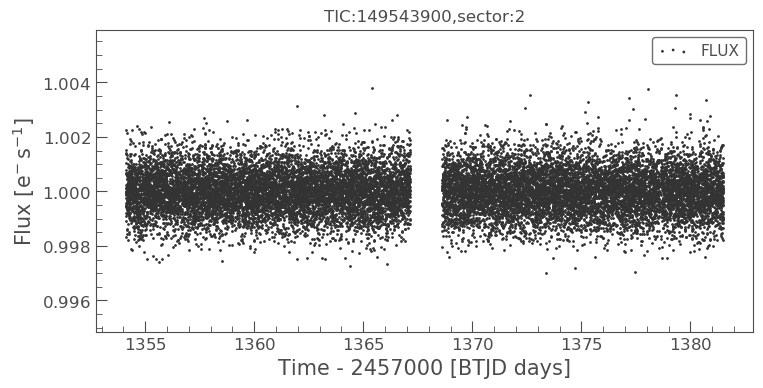

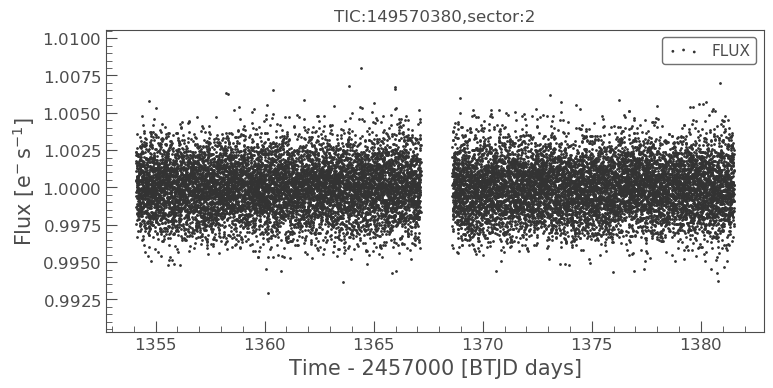

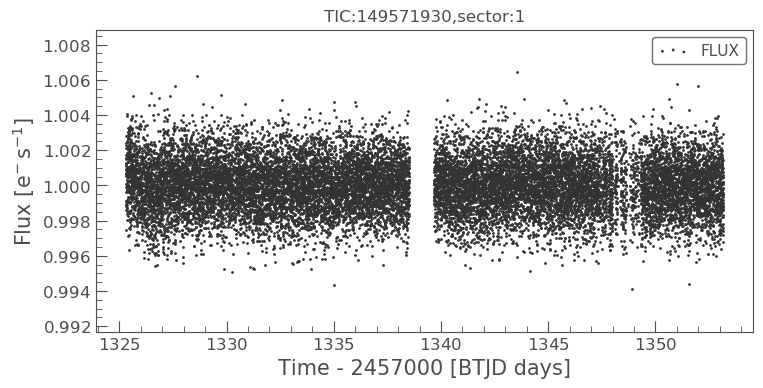

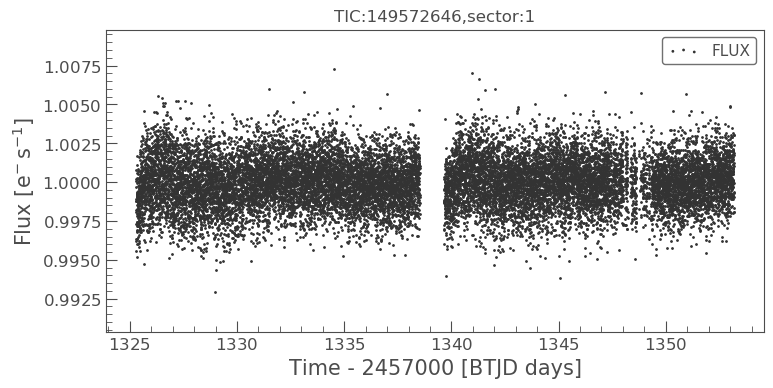

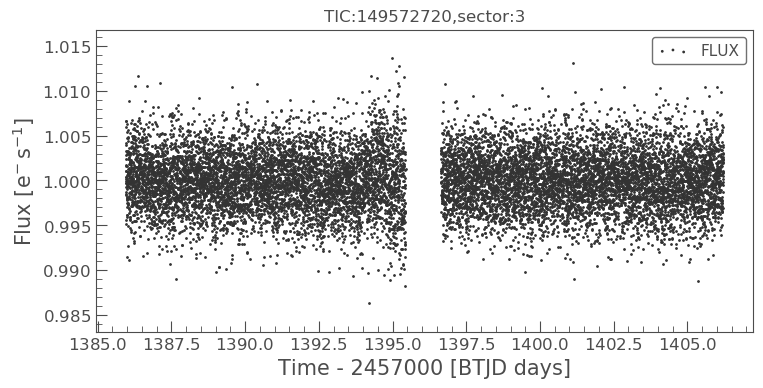

...

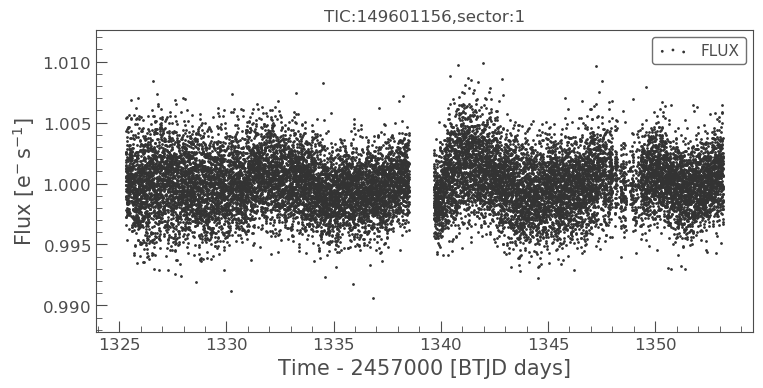

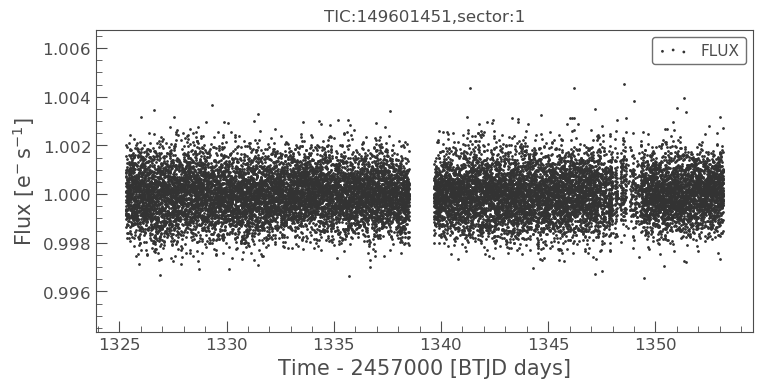

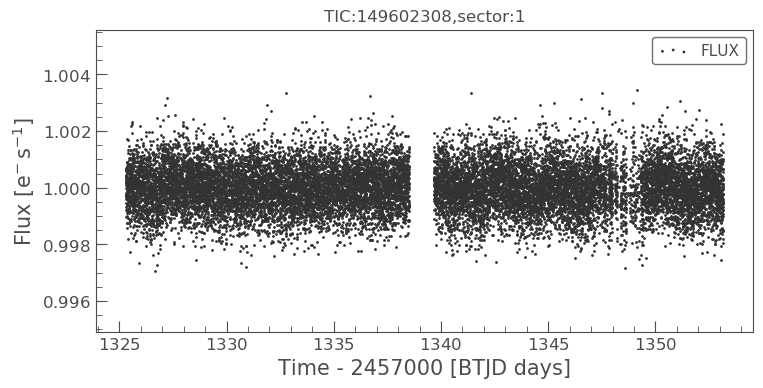

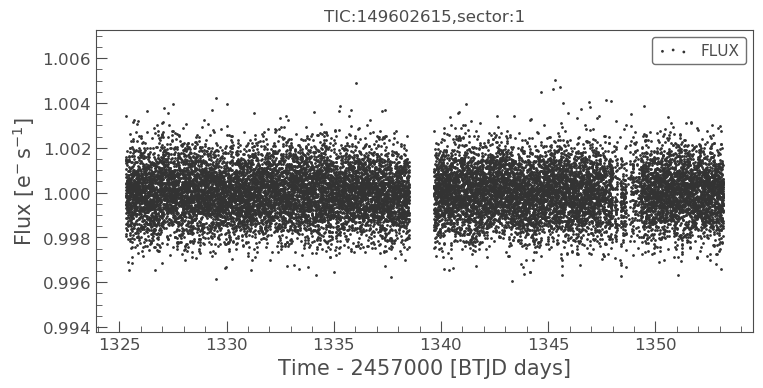

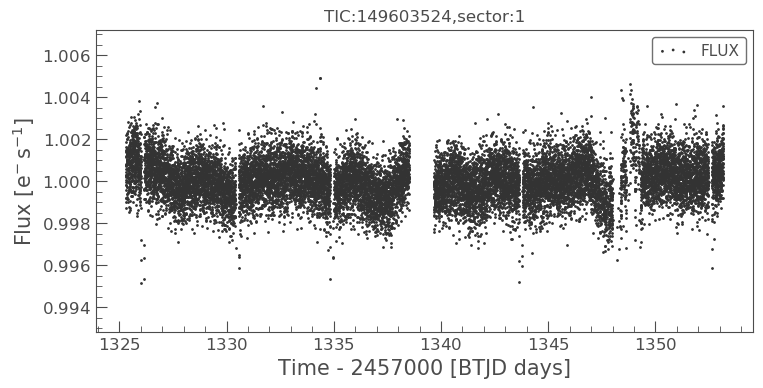

In [50]:
for tic in goodtics[600:620]:
    plot_1sector(tic);
    print(tic)
# plot_1sector(1234)

In [ ]:
149603524

# analyzing BY sector

In [12]:
# try looking at periods per sector do they show a trend per star that could mean probs in a certain secty

Average LS1 Rotation Period for TIC 149603524 is: 5.5386253148736095
Highest Amplitude from sector: 8
verify: 149603524 matches: 149603524
Stitched RP:  5.360226932836758
Mean of rps less than 5 is:  3.4696554838700884


ID,sector,lsrp1,lsamp1,rvar
int64,int64,float64,float64,float64
149603524,1,6.262893861676344,0.03422780476052554,0.0032229304313660108
149603524,2,3.2803486126938948,0.06918488089647844,0.0032150447368621826
149603524,3,7.340679959302863,0.07811008577971287,0.0031775504350662893
149603524,4,4.158775311599356,0.12890119858843227,0.0036886692047117813
149603524,6,4.32509653712008,0.1282801370471934,0.003520625829696477
149603524,7,2.3355684947344084,0.06110031548760141,0.0033802747726441322
149603524,8,7.125267734612473,0.1455569059236555,0.004417657852172852
149603524,9,7.428132103222357,0.09873363077581312,0.0035858809947968413
149603524,10,8.305178496681219,0.04156622148277255,0.003236937522888006


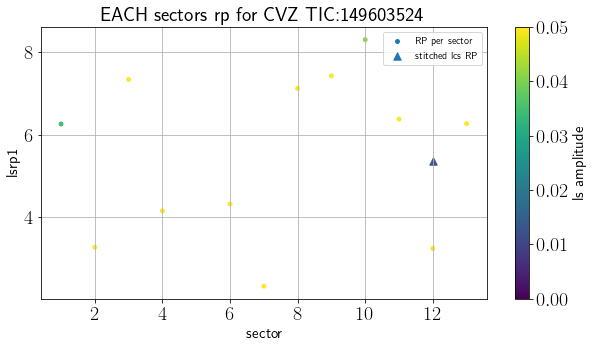

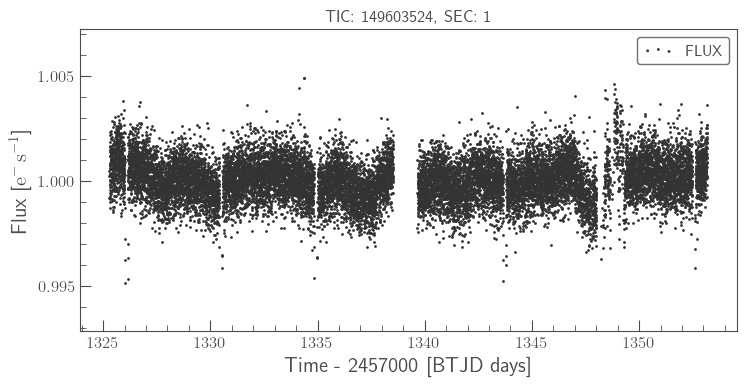

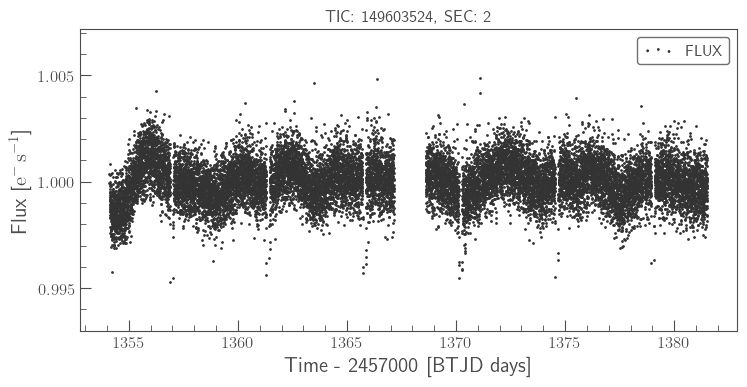

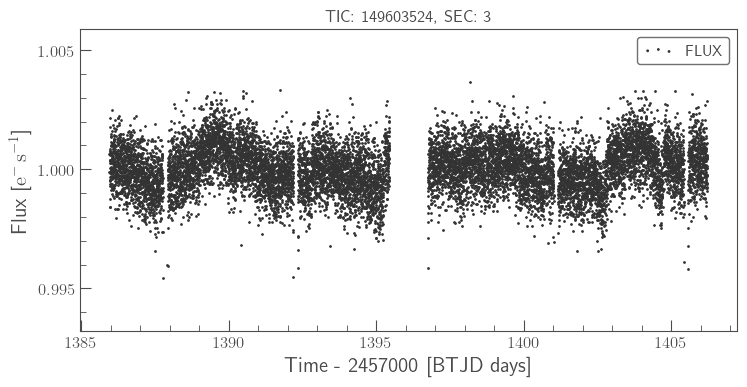

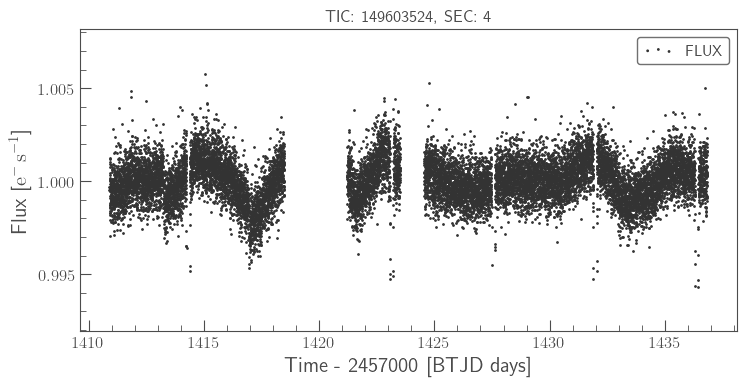

...

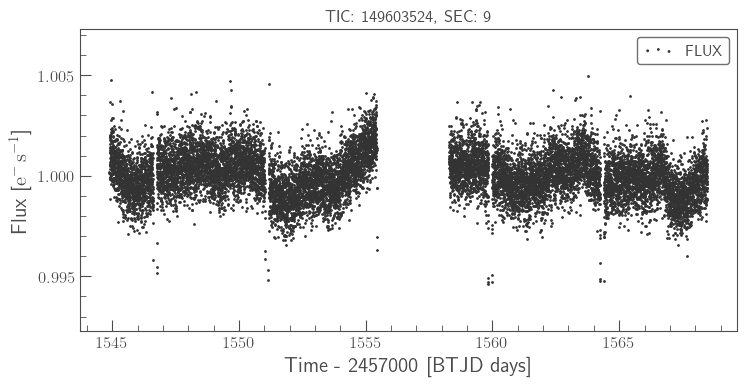

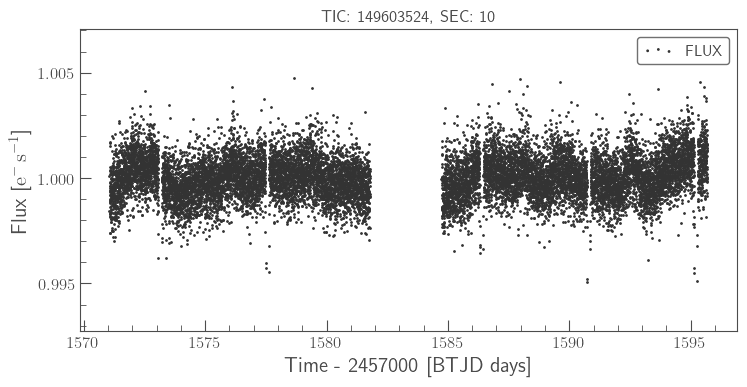

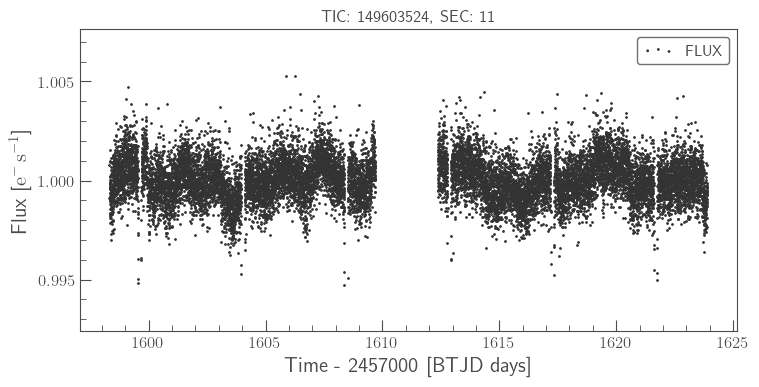

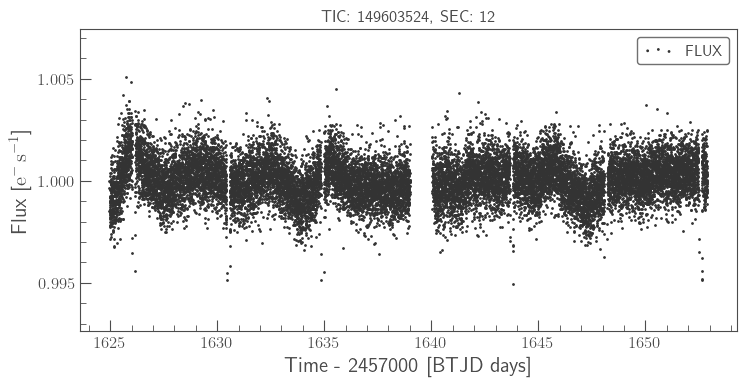

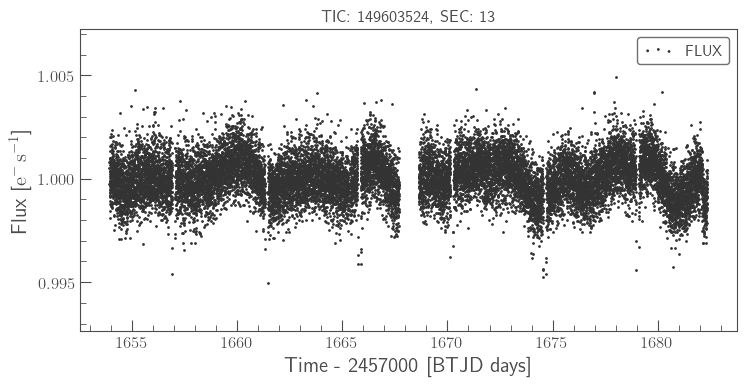

In [54]:
interesting_tics =[140891597, 141423634, 141606986, 141685465, 141809359]
tic = 149603524 #interesting_tics[0]                    #140801898#str(goodtics[145]) #25063296
myt = plot_rps(tic,plot=True)
limit = 5#20
shortmyt = myt[myt['lsrp1']<limit]
avg = np.mean(shortmyt['lsrp1'])
print('Mean of rps less than', limit,'is: ',avg)
myt

# planet hunting

In [61]:
#attempting to phase fold that planet
# import lightkurve as lk
# import starspot as ss
# from starspot import sigma_clipping
tic = 149603524
# filepath = 'data/SECONDRUN/cleaned_LightCurves/{}/sector1_lc.fits'.format(tic)
# lc = lk.open(filepath)

lc = fits.open('data/SECONDRUN/cleaned_LightCurves/{}/sector1_lc.fits'.format(tic)) #lk cant find flux attribute

data = lc[1].data #all the data
flux1 = data['FLUX']
flux_err1 = data['FLUX_ERR']
time1 = data['TIME']
# cadence = data['CADENCENO']
# quality = data['QUALITY']
# #extra cleaning- ruths tutorial
# # Calculate the median so that we can median-normalize.
# med = np.median(flux1)
# # Do an initial sigma clip to remove big outliers.
# m = sigma_clipping.sigma_clip(flux1/med - 1, nsigma=5)
# x, y, yerr = time1[m], flux1[m]/med - 1, flux_err1[m]/med
# # Then a sigma clip using a Sav-Gol filter for smoothing
# smooth, mask = sigma_clipping.filter_sigma_clip(x, y, window_length=199)
# time, flux, flux_err = x[mask], y[mask], yerr[mask]
# #creating model & gathering stats
# rotate = ss.RotationModel(time, flux, flux_err)

# period_grid = np.linspace(.1,2,1000)
# pdm_rp, pdm_err = rotate.pdm_rotation(period_grid, pdm_nbins = 10)
# print('pdm:',pdm_rp)

# #pdm plots
# rotate.pdm_plot()
# plt.title('TIC:{} with period:{} days'.format(tic,pdm_rp),fontsize=20,loc='left')
# #plt.close()

4.399999999999864

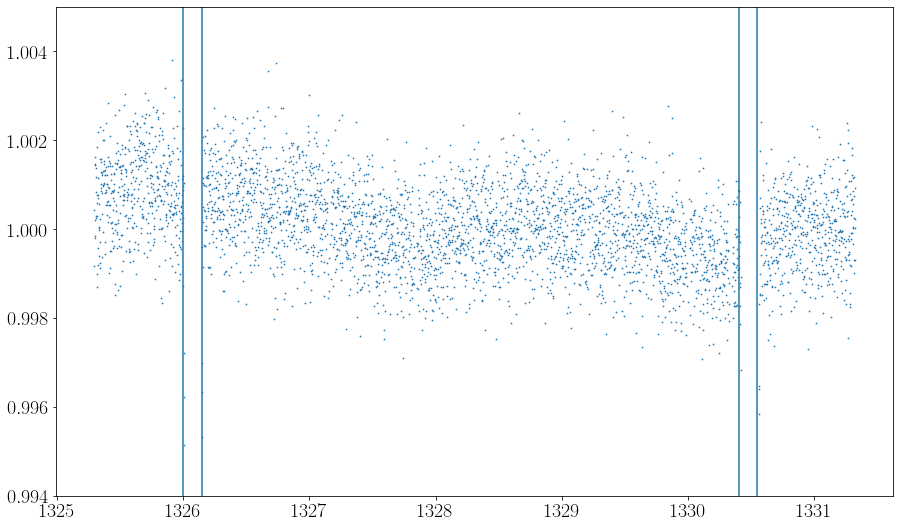

In [84]:
np.where(time1==1331.) 
time1[4000]
# 1331-1325
# 6 * 24*30
plt.figure(figsize=(15,9))
plt.scatter(time1[0:4000],flux1[0:4000],s= .5)
plt.axvline(1326)
plt.axvline(1326.15)

plt.axvline(1330.4)
plt.axvline(1330.55)
# plt.xlim()
plt.ylim(.994,1.005)
(1330.4+1330.55)/2 -(1326+ 1326.15)/2

In [75]:
np.where(i <=1.004 for i in flux1[0:4000])

(array([0]),)

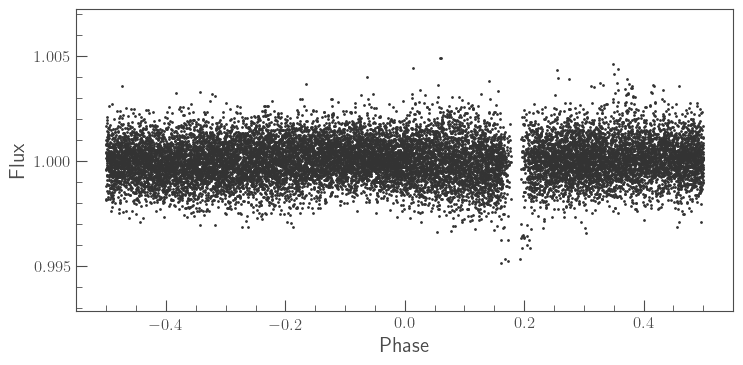

In [94]:
# lc.fold(period=6.27, t0=1325.504)
# lc.flux

lc = lk.LightCurve(time=time1, flux=flux1)
folded_lc = lc.fold(period=4.4, t0=1325.29560084)
folded_lc.scatter();

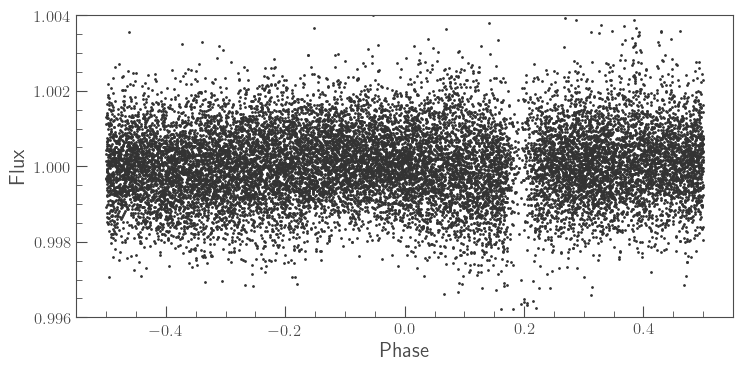

In [92]:
folded_lc.scatter();
plt.ylim(.996,1.004);



(0.9985, 1.0015)

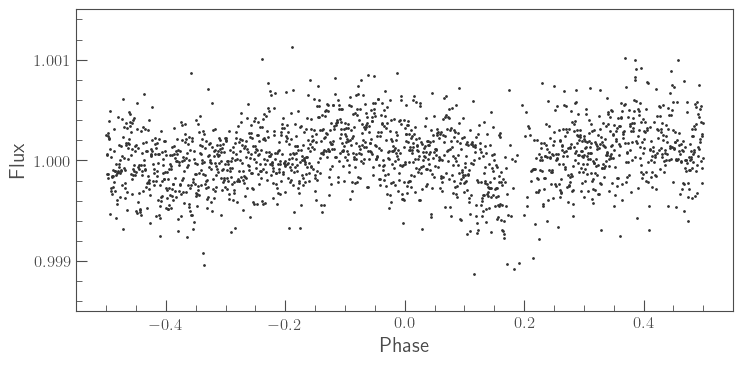

In [88]:
binned_lc = folded_lc.bin(binsize=10)
binned_lc.scatter();
plt.ylim(.9985,1.0015)
# plt.xlim()

Text(0.0, 1, 'TIC:149603524 with period:1.6386386386386387 days')

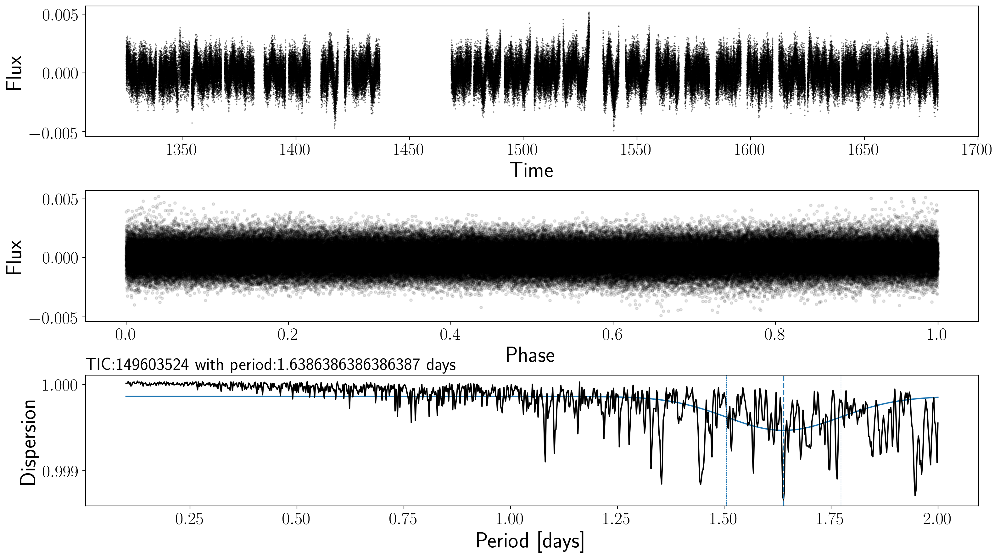

In [53]:
#pdm plots
rotate.pdm_plot()
plt.title('TIC:{} with period:{} days'.format(tic,pdm_rp),fontsize=20,loc='left')



(0.99, 1.007)

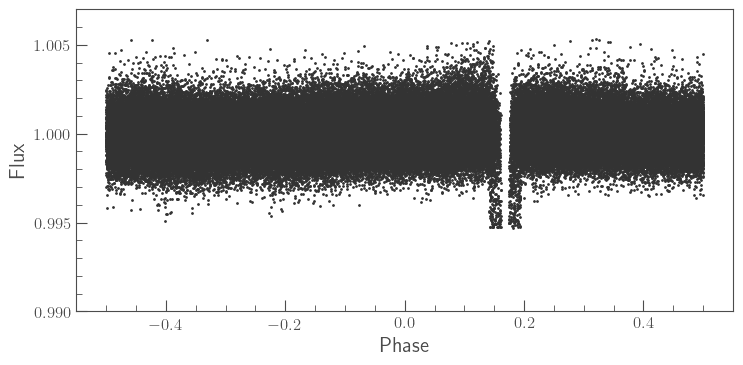

In [102]:
tic = 149603524
lc = fits.open('data/SECONDRUN/cleaned_LightCurves/{}/lc.fits'.format(tic)) #lk cant find flux attribute

data = lc[1].data #all the data
flux2 = data['FLUX']
flux_err2 = data['FLUX_ERR']
time2 = data['TIME']
lc = lk.LightCurve(time=time2, flux=flux2)
folded_lc = lc.fold(period=4.413, t0=1325.29560084)
folded_lc.scatter();
plt.ylim(.99,1.007)

(0.1, 0.25)

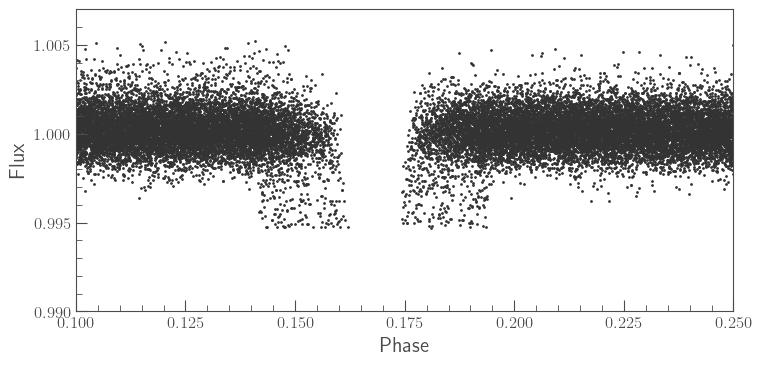

In [104]:
#min(flux2) #0.9947164
folded_lc.scatter();
plt.ylim(.99,1.007)
plt.xlim(.1,.25);

(0.993, 1.007)

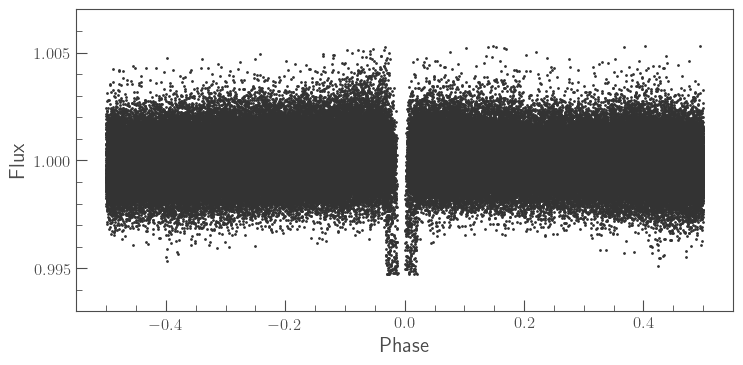

In [109]:
#(1330.4+1330.55)/2 #1330.475

tic = 149603524
lc = fits.open('data/SECONDRUN/cleaned_LightCurves/{}/lc.fits'.format(tic)) #lk cant find flux attribute

data = lc[1].data #all the data
flux3 = data['FLUX']
flux_err3 = data['FLUX_ERR']
time3 = data['TIME']
lc = lk.LightCurve(time=time3, flux=flux3)
folded_lc = lc.fold(period=4.413, t0=1330.475)
folded_lc.scatter();
plt.ylim(.993,1.007)

In [110]:
allstats[allstats['ID']==149603524] #temp = 6391.0 Kelvin temperr = 115.876

ID,TOTsecs,rvar,ls1,ls2,ls3,lsamp1,lsamp2,lsamp3,acf1,acf2,acf3,acfamp1,acfamp2,acfamp3,version,HIP,TYC,UCAC,TWOMASS,SDSS,ALLWISE,GAIA,APASS,KIC,objType,typeSrc,ra,dec,POSflag,pmRA,e_pmRA,pmDEC,e_pmDEC,PMflag,plx,e_plx,PARflag,gallong,gallat,eclong,eclat,Bmag,e_Bmag,Vmag,e_Vmag,umag,e_umag,gmag,e_gmag,rmag,e_rmag,imag,e_imag,zmag,e_zmag,Jmag,e_Jmag,Hmag,e_Hmag,Kmag,e_Kmag,TWOMflag,prox,w1mag,e_w1mag,w2mag,e_w2mag,w3mag,e_w3mag,w4mag,e_w4mag,GAIAmag,e_GAIAmag,Tmag,e_Tmag,TESSflag,SPFlag,Teff,e_Teff,logg,e_logg,MH,e_MH,rad,e_rad,mass,e_mass,rho,e_rho,lumclass,lum,e_lum,d,e_d,ebv,e_ebv,numcont,contratio,disposition,duplicate_id,priority,eneg_EBV,epos_EBV,EBVflag,eneg_Mass,epos_Mass,eneg_Rad,epos_Rad,eneg_rho,epos_rho,eneg_logg,epos_logg,eneg_lum,epos_lum,eneg_dist,epos_dist,distflag,eneg_Teff,epos_Teff,TeffFlag,gaiabp,e_gaiabp,gaiarp,e_gaiarp,gaiaqflag,starchareFlag,VmagFlag,BmagFlag,splists,e_RA,e_Dec,RA_orig,Dec_orig,e_RA_orig,e_Dec_orig,raddflag,wdflag,objID
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,str12,str10,str16,str1,str19,str19,str8,int64,str4,str10,float64,float64,str10,float64,float64,float64,float64,str6,float64,float64,str5,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str19,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,str5,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,float64,float64,float64,float64,float64,float64,int64,float64,str5,str1,float64,float64,float64,str8,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str6,float64,float64,str6,float64,float64,float64,float64,int64,str1,str8,str8,str15,float64,float64,float64,float64,float64,float64,int64,int64,int64
149603524,12,0.0034569859504699485,5.360226932836758,3.334053496090116,5.850111621245946,0.013303566468243978,0.013274880798719324,0.011979868255980615,0.0694445,4.41111464,26.4722434,0.5624178653314038,0.2623845371185038,0.257985583233847,20190415,--,8900-00874-1,131-006781,05483359-6359183,N,J054833.56-635918.1,4756649415309914240,29848754,--,STAR,tmgaia2,87.1399740872908,-63.988440787086,tmgaia2,-15.6405,0.0371897,26.0463,0.0365854,gaia2,5.66486,0.0189104,gaia2,273.415812449388,-31.0335697980936,63.7531796047894,-87.1638479174296,10.734,0.078,10.213,0.005,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,9.272,0.024,9.008,0.024,8.944,0.021,AAA-222-111-000-0-0,nan,8.896,0.023,8.917,0.02,8.87,0.022,9.165,0.307,10.0721,0.000305,9.7109,0.006,rered,spect,6391.0,115.876,4.37665,0.0797224,0.24,0.05,1.21427,0.0542211,1.28,0.190812,0.714926,0.150172,DWARF,2.21616721,0.1061619,175.631,0.588,0.0202575,0.01075925,971,0.0163922813,N/A,N,0.00709071476,0.0109007,0.0106178,schlegel,0.160421,0.221203,0.0500111,0.0584312,0.129424,0.170919,0.0597669,0.0996779,0.0974178,0.114906,0.586,0.59,bj2018,102.407,129.345,spect,10.355,0.00104,9.67009,0.001594,1,N,tycho2v3,tycho2b3,N/A,0.679915272702027,0.567409162263974,87.1398205343019,-63.9883286433749,0.0177794575227992,0.019508362038221,1,0,553086869


# back to other stuff

Average LS1 Rotation Period for TIC 140998522 is: 3.200261805057721
Highest Amplitude from sector: 4
verify: 140998522 matches: 140998522
Stitched RP:  2.9149417326470326
Average LS1 Rotation Period for TIC 141024724 is: 10.73207807818767
Highest Amplitude from sector: 1
verify: 141024724 matches: 141024724
Stitched RP:  20.680862152402934
Average LS1 Rotation Period for TIC 141024799 is: 3.932744922434969
Highest Amplitude from sector: 6
verify: 141024799 matches: 141024799
Stitched RP:  3.539932967159005
Average LS1 Rotation Period for TIC 141025090 is: 4.259507165536291
Highest Amplitude from sector: 8
verify: 141025090 matches: 141025090
Stitched RP:  3.2572879288913903
Average LS1 Rotation Period for TIC 141026267 is: 3.566117007638841
Highest Amplitude from sector: 4
verify: 141026267 matches: 141026267
Stitched RP:  6.349505686039202
[140998522 141024724 141024799 141025090 141026267]


5

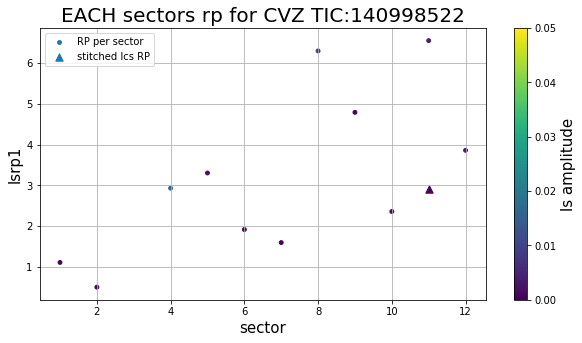

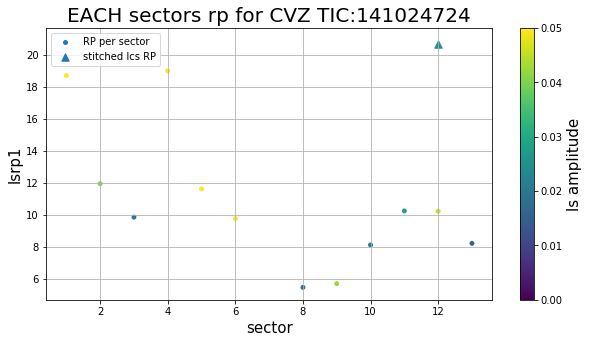

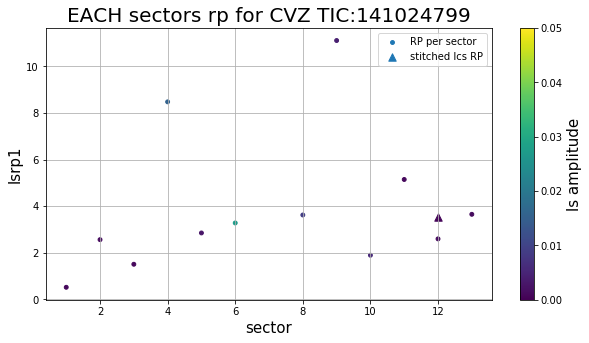

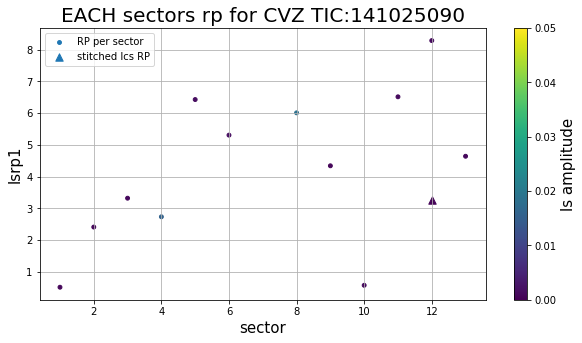

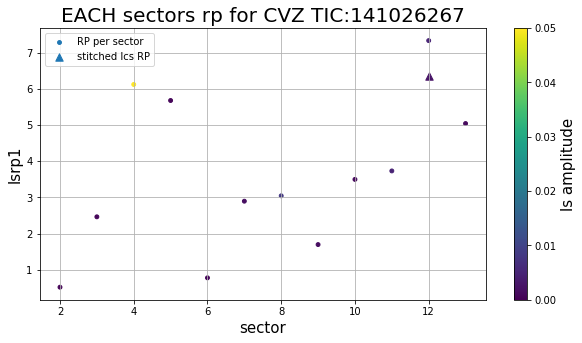

In [14]:
#loop over multiple tics
ticids = goodtics[140:145]#[140:145]
tabs = []
for i in ticids:
    si = str(i) ### this fixed to loop correctly
    tab = plot_rps(si)
    tabs.append(tab)
#     print(i)
print(ticids)
len(tabs)

In [15]:
# %whos #lists all active variables

In [16]:
#needed somwhere but comment out for now b/c dont know where

# seen, uniqs =uniquefinder(tics)
# len(uniqs)

# Means comparison for LS

In [17]:
#get the means for all ls1 rps per ticid

mysums = []
for row in cvzsecs:
    tic = row['ID']
    mask = np.where(cvzsecs['ID']==tic)
    apply = cvzsecs[mask]
    mysum = np.mean(apply['ls1'])
    mysums.append(mysum)
#     print(mysum)
#     break
len(mysums)

70865

In [18]:
# gets one mean per ticid (b/c prior had same mean repeated per sector per tic)
seen2, sums =uniquefinder(mysums)
len(sums)

there are 5995 unique tics. Use the first output dictionary to see number of occurances for duplicates


5995

In [19]:
#needed somwhere but comment out for now b/c dont know where

# seen, uniqs =uniquefinder(tics)
# len(uniqs)

# fix below

In [22]:
# #pulls ls1 values from stitched lcs to match cvzsecs means
# lss=[]
# for i in uniqs:
#     if i in cvzstats['ID']:
#         row = cvzstats[cvzstats['ID']==i]
#         ls = row['ls1']
#         lss.append(ls)
#     else:
#         pass
# len(lss)

In [23]:
# #plots comparision
# plt.figure(figsize=(10,5))
# plt.scatter(sums,lss,s=.2)
# plt.xlabel('Mean RP of Sectors',fontsize=20)
# plt.ylabel('RP from Stitched LCs',fontsize=20)
# plt.xscale('log')
# plt.yscale('log')
# plt.title('Comparing Sector RP Mean to Stitched Sectors RP',fontsize=25);

# Means comparison for ACF

In [ ]:
mysumsACF = []
for row in cvzsecs:
    tic = row['ID']
    mask = np.where(cvzsecs['ID']==tic)
    apply = cvzsecs[mask]
    mysum = np.mean(apply['acf1'])
    mysumsACF.append(mysum)
#     print(mysum)
#     break
len(mysumsACF)

#### below is a problem--work on why 

In [ ]:
# gets one mean per ticid (b/c prior had same mean repeated per sector per tic)
seen3, sumsACF =uniquefinder(mysumsACF)
len(sumsACF)
#why sint this 5995 ?????

In [ ]:
#test
for i in cvzsecs['acf1']:
    if np.isnan(i) == True:
        print(i)
    else:
        print(i)
        break

In [ ]:
#test
np.isnan(cvzsecs['acf1'])
print('so theres no nans....why still short on vals....????')

In [ ]:
#pulls ls1 values from stitched lcs to match cvzsecs means
acfs=[]
for i in uniqs:
    if i in cvzstats['ID']:
        row = cvzstats[cvzstats['ID']==i]
        acf = row['acf1']
        acfs.append(acf)
    else:
        pass
len(acfs)

# Looking for trends in sectors

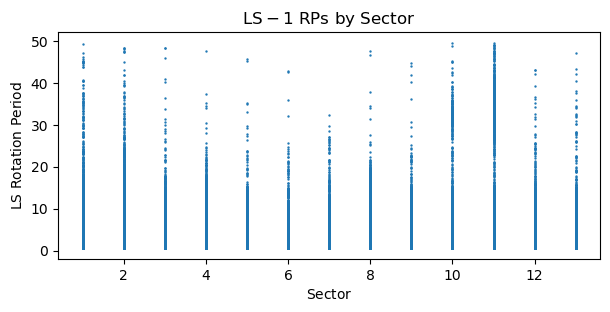

In [9]:
plt.figure(figsize=(7,3),dpi=100)
plt.scatter(secstats['sector'],secstats['ls1'],s=.5)
plt.xlabel('$\mathrm{Sector}$',fontsize=10)
plt.ylabel('$\mathrm{LS~Rotation~Period}$',fontsize=10);
plt.title('$\mathrm{LS-1~RPs~by~Sector}$');

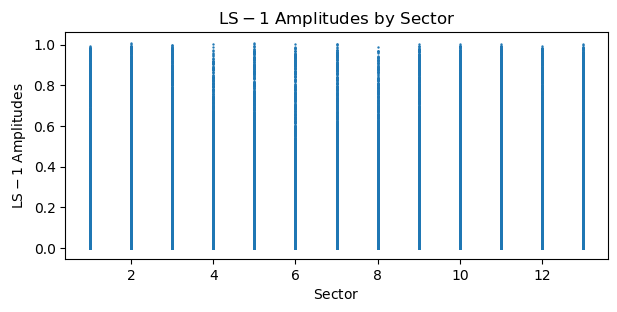

In [10]:
plt.figure(figsize=(7,3),dpi=100)
plt.scatter(secstats['sector'],secstats['lsamp1'],s=.5)
plt.xlabel('$\mathrm{Sector}$',fontsize=10)
plt.ylabel('$\mathrm{LS-1~Amplitudes}$',fontsize=10);
plt.title('$\mathrm{LS-1~Amplitudes~by~Sector}$');

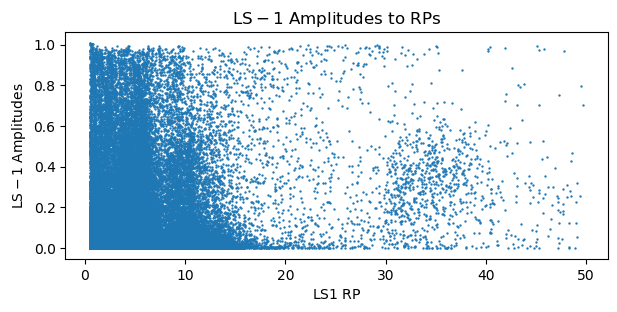

In [11]:
plt.figure(figsize=(7,3),dpi=100)
plt.scatter(secstats['ls1'],secstats['lsamp1'],s=.5)
plt.xlabel('$\mathrm{LS1~RP}$',fontsize=10)
plt.ylabel('$\mathrm{LS-1~Amplitudes}$',fontsize=10);
plt.title('$\mathrm{LS-1~Amplitudes~to~RPs}$');

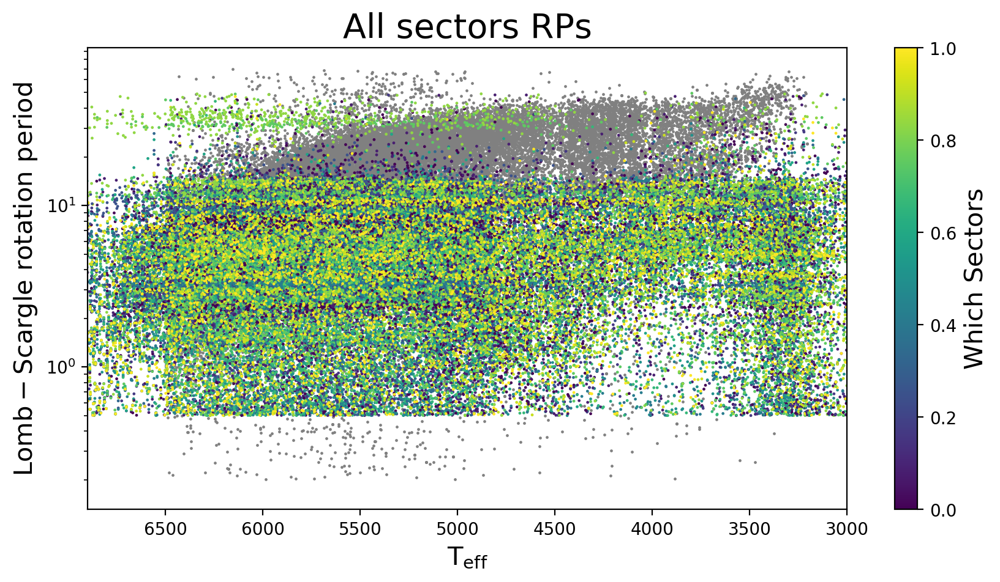

In [12]:
plt.figure(figsize=(10,5),dpi=200)
plt.scatter(secstats['Teff'],secstats['ls1'],s=.5,c=secstats['sector'],vmax=13,vmin=1, rasterized=True);
plt.scatter(mq['TEMP'],mq['ROTATION_PERIOD'],s=.5,vmax=13,vmin=1,zorder=0,color = 'grey', rasterized=True)#label='mcquillan is blue');


plt.xlabel('$\mathrm{T_{eff}}$',fontsize=15);
plt.ylabel("$\mathrm{Lomb-Scargle~rotation~period}$",fontsize=15);
# plt.axvline(27) #cadence
plt.yscale('log')
plt.xlim(6900,3000)
# plt.legend()
plt.colorbar().set_label(label='$\mathrm{Which~Sectors}$',size=15)
plt.title('All sectors RPs',fontsize=20);

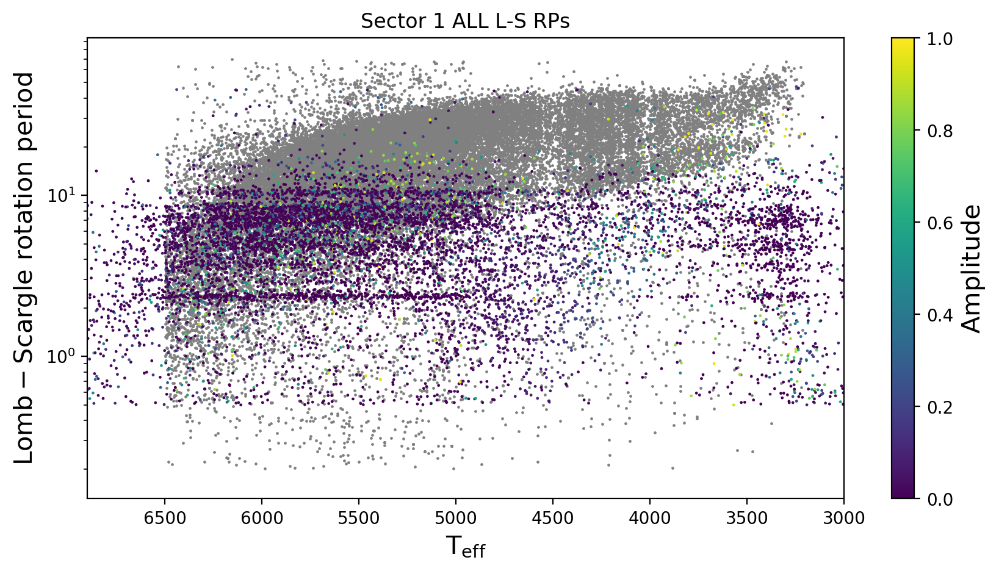

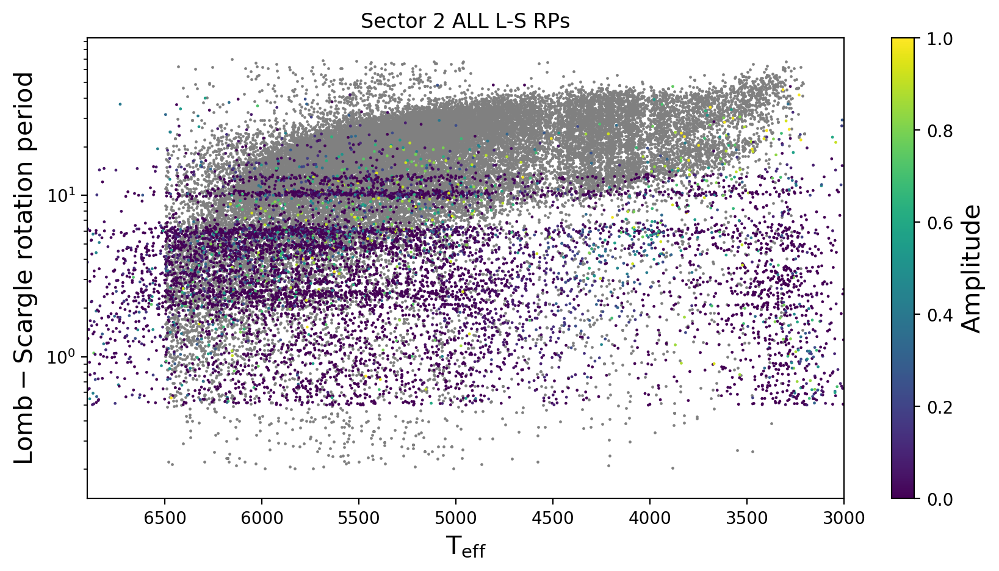

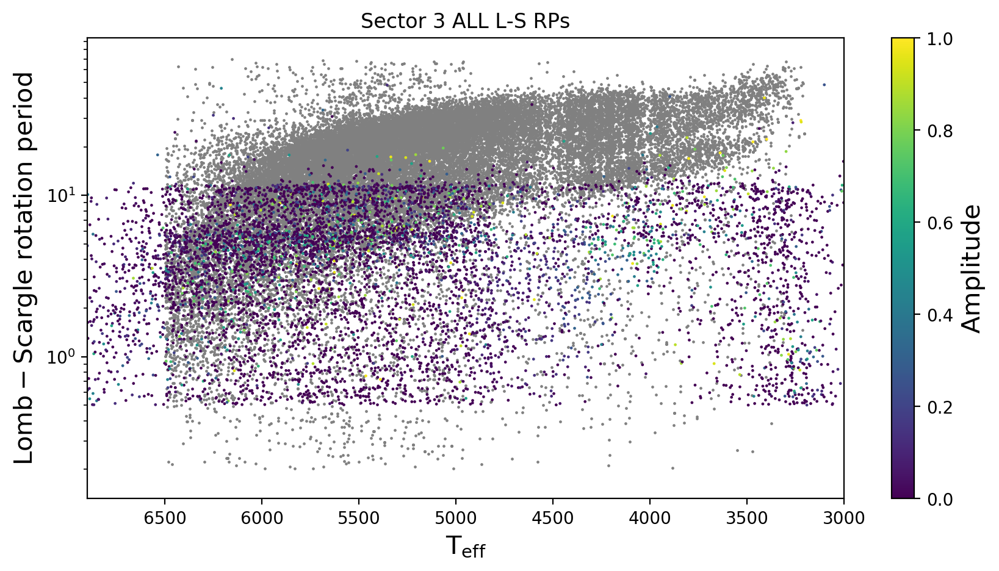

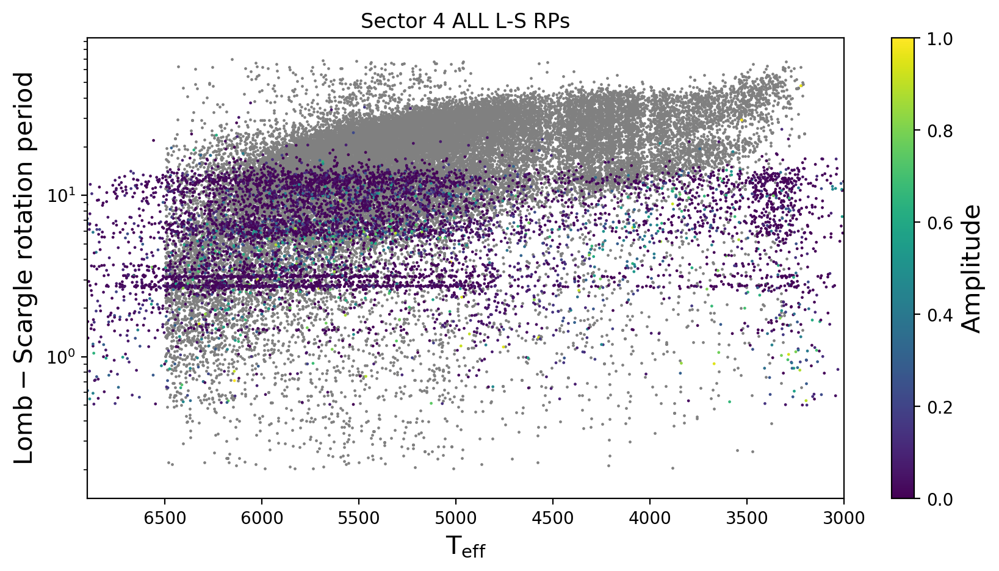

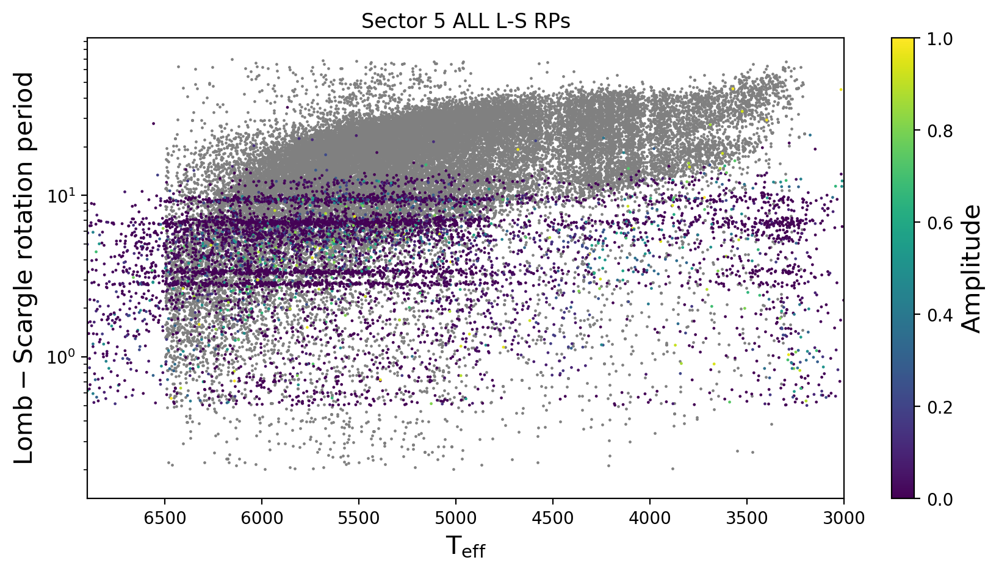

...

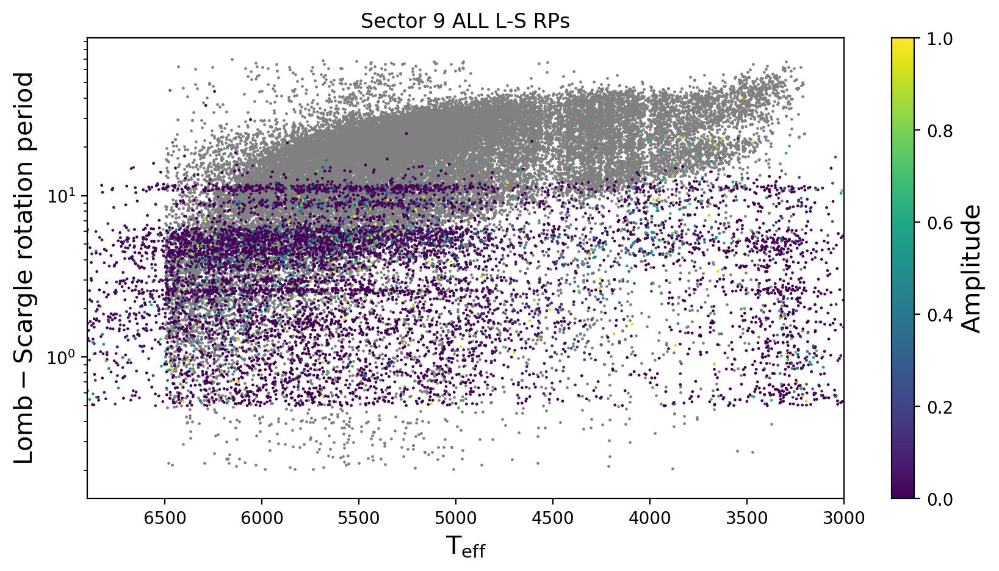

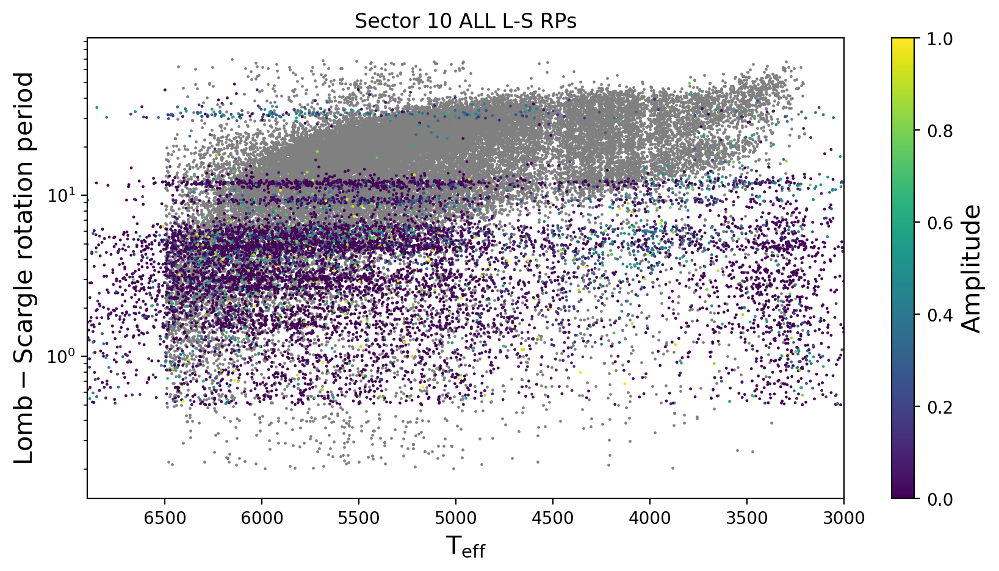

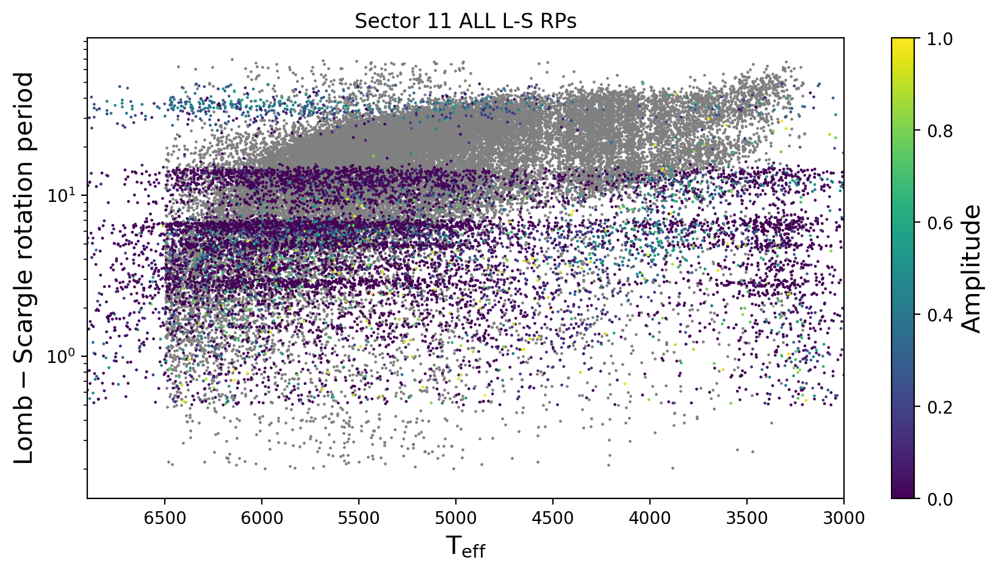

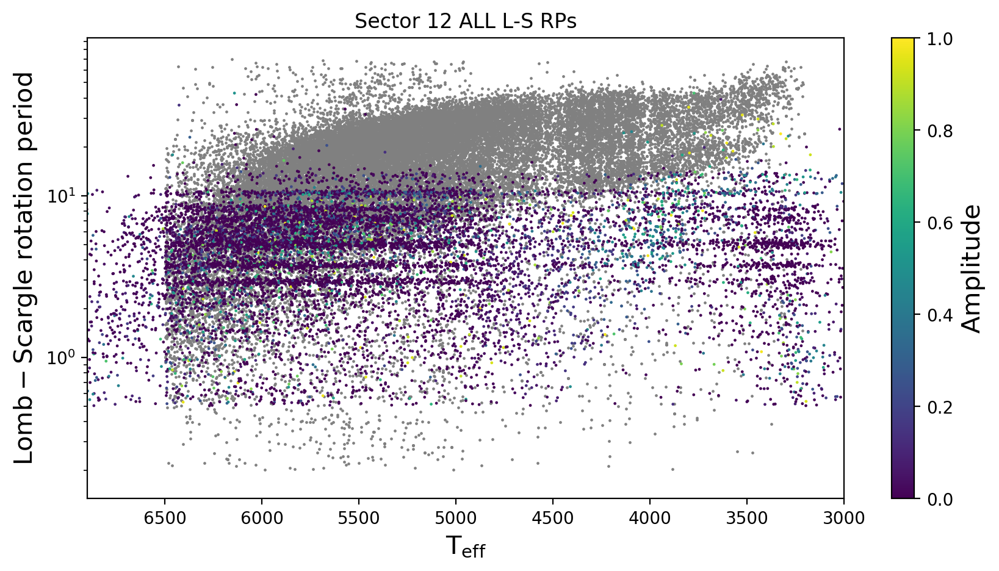

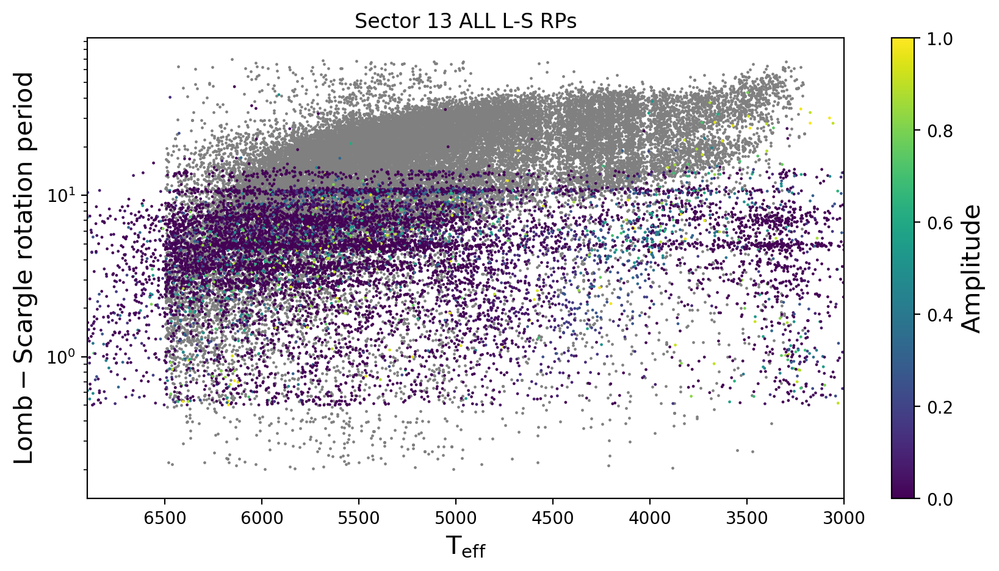

In [28]:
#tests to make above plots a function
for i in range(1,14):
    sector_overlay(i)

# Exploring long rps

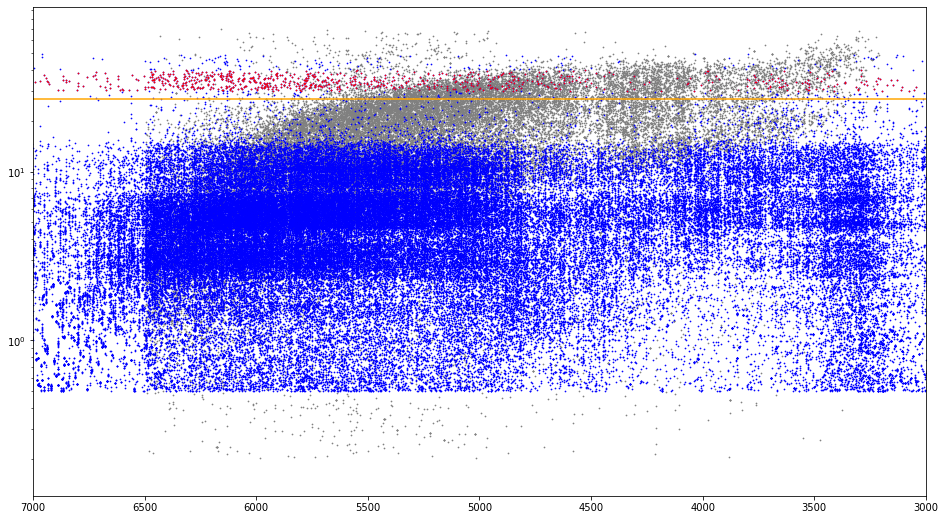

In [13]:
interesting1 = secstats[secstats['ls1']>30]
interesting = interesting1[interesting1['ls1']<40]

plt.figure(figsize=(16,9))
plt.scatter(secstats['Teff'],secstats['ls1'],color='b',s=.5, rasterized=True)
plt.scatter(interesting['Teff'],interesting['ls1'],s=.5,color='r', rasterized=True)
plt.scatter(mq['TEMP'],mq['ROTATION_PERIOD'],s=.5,zorder=0,color = 'grey', rasterized=True)#label='mcquillan is blue');
plt.axhline(27,color='orange')

plt.yscale('log')
plt.xlim(7000,3000);

In [15]:
len(secstats),len(interesting1)#limit ls grid in sspot from 0-50 days so limiit to 15 days

(112219, 934)

In [16]:
#i want to see how many sectors measure > 27 days PER star


#first attempt - how many sectors >27?
longrps = secstats[secstats['ls1']>27]
print('# of rps greater than 27 days  = ',len(longrps))


#2nd attempt how many of those are the same tic?
# for row in longrps:
#     tic = row['ID']
longtics = longrps['ID']
longs_seen, longs_uniqs = uniquefinder(longtics)
print('number of duplicates is:',len(longtics)-len(longs_uniqs))

#get those duplicates
long_dupes_tics = []
for tic in longs_seen:
    occurances = longs_seen[tic]
    if occurances != 1: #either 1 or 0, binary options only
        long_dupes_tics.append(tic)
        #print('TIC:',tic,'seen',occurances,'times')# damn so at most 2 sectors observe long rps
    else:
        pass
#see if those rps from the duplicates are similar to each other
for tic in long_dupes_tics:
    stats_table = secstats[secstats['ID'] == tic]
    shortstats_table = stats_table[stats_table['ls1']>27]
    rps = shortstats_table['ls1']
    difference = abs(rps[0]-rps[1])
    if difference <=3:
        print('for TIC:',tic,'the difference between the 2 rps longer than cadence is:',difference)

# of rps greater than 27 days  =  1065
there are 1011 unique tics. Use the first output dictionary to see number of occurances for duplicates
number of duplicates is: 54
for TIC: 25134376 the difference between the 2 rps longer than cadence is: 1.3676659158756976
for TIC: 31779649 the difference between the 2 rps longer than cadence is: 2.8007412238700553
for TIC: 40518041 the difference between the 2 rps longer than cadence is: 2.1447157682584645
for TIC: 55298910 the difference between the 2 rps longer than cadence is: 0.7519338345074296
for TIC: 55523561 the difference between the 2 rps longer than cadence is: 2.416035351353873
for TIC: 141770299 the difference between the 2 rps longer than cadence is: 1.7377025408908224
for TIC: 149988523 the difference between the 2 rps longer than cadence is: 1.5656071468268031
for TIC: 260372062 the difference between the 2 rps longer than cadence is: 0.20895974208860935
for TIC: 267399515 the difference between the 2 rps longer than cadence is:

# Benchmark sample stats

In [32]:
#def tics in benchmark sample ---visually inspected good rps (in most sectors)

bench = [139371600,140598179,140598225,140599471,140609384,140633568,140658982,140659350, \
140659980,140663057,140688941,140689653,140758953,140797148] #, \
#idk where these went, google sheet changed vals bc format issues
#140934712,140983279,141031845,141080412,141128978,141177545]

print(len(bench))
#need to make a bad bench too ----visually inspected wrong rps (large scatter of rps)
#badbench =[]

14


In [33]:
#pull stats table data for tics in benchmark

#get indices
idxs = []
lens=[]
for i in bench:
    indices = np.where(secstats['ID']==i)
    length = len(indices[0])
    lens.append(length)
    idxs.append(indices[0])
sums = np.sum(lens)
idxs = np.concatenate(idxs)
print('these should match or else investigate!',sums,len(idxs))
#idxs

#get data using indices

bench_table = secstats[idxs]


these should match or else investigate! 170 170


Question: how to quantize colorbar? need that to better distinguish colors ie separate tics


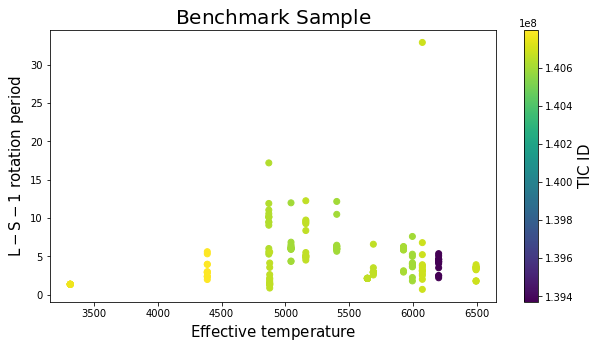

In [34]:
#exploring stats of benchmark

plt.figure(figsize=(10,5))
plt.scatter(bench_table['Teff'],bench_table['ls1'],c=bench_table['ID'])#['lsamp1'])
# plt.colorbar().set_label('$\mathrm{Amplitude}$',size=15)
plt.colorbar().set_label('$\mathrm{TIC~ID}$',size=15)
plt.xlabel('$\mathrm{Effective~temperature}$',size=15)
plt.ylabel('$\mathrm{L-S-1~rotation~period}$',size=15)
plt.title('$\mathrm{Benchmark~Sample}$',size=20);

print('Question: how to quantize colorbar? need that to better distinguish colors ie separate tics')

In [35]:
bench_table[bench_table['ls1']>20] #shows only one sector (out of 13) calculated ls1 wrong- others ok

ID,NUMsectors,sector,rvar,ls1,ls2,ls3,lsamp1,lsamp2,lsamp3,version,HIP,TYC,UCAC,TWOMASS,SDSS,ALLWISE,GAIA,APASS,KIC,objType,typeSrc,ra,dec,POSflag,pmRA,e_pmRA,pmDEC,e_pmDEC,PMflag,plx,e_plx,PARflag,gallong,gallat,eclong,eclat,Bmag,e_Bmag,Vmag,e_Vmag,umag,e_umag,gmag,e_gmag,rmag,e_rmag,imag,e_imag,zmag,e_zmag,Jmag,e_Jmag,Hmag,e_Hmag,Kmag,e_Kmag,TWOMflag,prox,w1mag,e_w1mag,w2mag,e_w2mag,w3mag,e_w3mag,w4mag,e_w4mag,GAIAmag,e_GAIAmag,Tmag,e_Tmag,TESSflag,SPFlag,Teff,e_Teff,logg,e_logg,MH,e_MH,rad,e_rad,mass,e_mass,rho,e_rho,lumclass,lum,e_lum,d,e_d,ebv,e_ebv,numcont,contratio,disposition,duplicate_id,priority,eneg_EBV,epos_EBV,EBVflag,eneg_Mass,epos_Mass,eneg_Rad,epos_Rad,eneg_rho,epos_rho,eneg_logg,epos_logg,eneg_lum,epos_lum,eneg_dist,epos_dist,distflag,eneg_Teff,epos_Teff,TeffFlag,gaiabp,e_gaiabp,gaiarp,e_gaiarp,gaiaqflag,starchareFlag,VmagFlag,BmagFlag,splists,e_RA,e_Dec,RA_orig,Dec_orig,e_RA_orig,e_Dec_orig,raddflag,wdflag,objID,acf1,acf2,acf3,acfamp1,acfamp2,acfamp3
int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,int64,int64,str12,str10,str16,str1,str19,str19,str8,int64,str4,str10,float64,float64,str10,float64,float64,float64,float64,str6,float64,float64,str5,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str19,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,str5,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,float64,float64,float64,float64,float64,float64,int64,float64,str5,str1,float64,float64,float64,str8,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str6,float64,float64,str6,float64,float64,float64,float64,int64,str1,str8,str8,str15,float64,float64,float64,float64,float64,float64,int64,int64,int64,float64,float64,float64,float64,float64,float64
140689653,13,11,0.001422405242919922,32.92148148148148,13.438883378891607,6.392906871037158,0.3806654762831416,0.033652155845088766,0.02440588182800694,20190415,22622,9169-00068-1,086-008715,04520332-7259435,N,J045203.50-725942.0,4652844556893751552,33575108,--,STAR,tmgaia2,73.0136882314846,-72.9953453801846,tmgaia2,87.06,0.105782,105.625,0.128392,gaia2,8.86997,0.0551508,gaia2,285.018329871765,-34.4425596428925,304.615805256155,-81.3499771431269,8.532,0.024,7.92,0.03,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,6.797,0.021,6.546,0.036,6.447,0.017,AAA-111-111-000-0-0,nan,6.421,0.089,6.374,0.027,6.454,0.016,6.411,0.046,7.76898,0.000334,7.3582,0.006,rered,spect,6073.0,128.15,3.67931,0.0810418,nan,nan,2.55758,0.123686,1.14,0.145132,0.0681421,0.0148464,DWARF,8.016178,0.3454605,112.38,0.7015,0.0406078,0.0104261,1195,0.00458487542,N/A,N,0.005866899,0.0103821,0.0104701,schlegel,0.111676,0.178588,0.0973176,0.150054,0.0202087,0.0094841,0.0945387,0.0675449,0.377803,0.313118,0.697,0.706,bj2018,137.587,118.714,spect,8.10249,0.001837,7.32091,0.002296,1,N,hipvmag,tycho2b3,N/A,2.04019946159091,1.99085562269805,73.0149699632283,-72.9948906098847,0.0483635056708111,0.0557101844587414,1,0,529476037,0.07361117,0.08611118000000001,0.12777788,0.2242571708384259,0.22301349719415592,0.21557294717384576


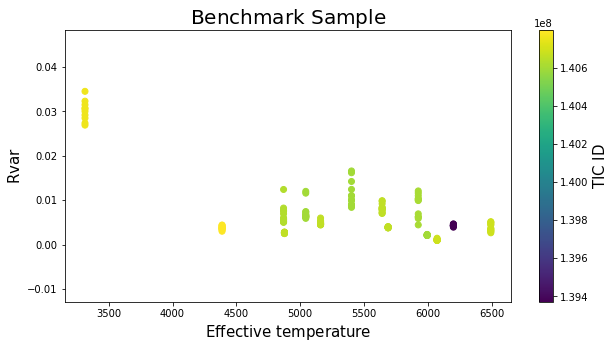

In [36]:
#exploring stats of benchmark

plt.figure(figsize=(10,5))
plt.scatter(bench_table['Teff'],bench_table['rvar'],c=bench_table['ID'])#['lsamp1'])
# plt.colorbar().set_label('$\mathrm{Amplitude}$',size=15)
plt.colorbar().set_label('$\mathrm{TIC~ID}$',size=15)
plt.xlabel('$\mathrm{Effective~temperature}$',size=15)
plt.ylabel('$\mathrm{Rvar}$',size=15)
plt.title('$\mathrm{Benchmark~Sample}$',size=20);

In [62]:
# want to try binning rps per star to see which values are most common
cadence = 27 #days
for row in cvzsecs: #dont want to use secstats b/c if only 1 sector bins fails
    tic = row['ID']
    onestar_table = secstats[secstats['ID']==tic]
    rps = onestar_table['ls1']
    bins = np.arange(0,cadence+1,1) #use same bins sizes for all
#     print(bins)
#     break
    values = {}
    value=[]
    keys=[]
    #organize rps into the bins
    for rp in rps:
#         while rp <= cadence:
        for val in bins:
            srp = int(rp) #so i can index
            vals = str(val)
            if srp == val:
#                 print(rp,val)
                values.update({val:rp})
#     break
print(values)
# #             print(rp,rp[0])
# #             print(bins[val],rp[0])
#             if rp[0]== str(bins[val]):# and rp <= bins[val+1]:
#                 print(rp[0],str(bins[val]))
#                 value.append(float(rp))
#                 keys.append(str(bins[val]))
#                 #for i in keys:
#                 values[val] = value
# #     print(values)
#     break
# values.keys()            
        
#     break

KeyboardInterrupt: 

# how many sectors match stitched rp PER star?

In [12]:
#how many sectors match stitched rp PER star?

match_tics=[]
match_secs=[]
match_secrp=[]
match_stitch=[]
count = 0
for row in cvzsecs:
    tic = row['ID']
    sec_rp = row['ls1']
    sector = row['sector']
    stitched_table = allstats[allstats['ID']==tic]
    stitched_rp = stitched_table['ls1']
    thresh = (.1 * stitched_rp) / 100 #want within +- 10% of stitched rp value
    if sec_rp > stitched_rp - thresh and sec_rp < stitched_rp + thresh:
        count += 1
        match_tics.append(tic)
        match_secs.append(sector)
        match_secrp.append(sec_rp)
        match_stitch.append(stitched_rp[0])
        #print('TIC: ',tic,'with stitched rp:' ,stitched_rp,'matches sector:',sector,'with rp:',sec_rp) )
    else:
        pass
mydata = {'tic':match_tics,'sector':match_secs,'sec_rp':match_secrp,'stitched_rp':match_stitch}
mydf = pd.DataFrame(data=mydata)
print(count) #2524 out of 70865

2524


In [13]:
mydf

,tic,sector,sec_rp,stitched_rp
0,25078120,4,0.823393,0.823232
1,25078120,6,0.823541,0.823232
2,25078120,7,0.823259,0.823232
3,25078120,8,0.823393,0.823232
4,25078120,13,0.822964,0.823232
...,...,...,...,...
2519,453079880,10,0.868192,0.868760
2520,453097891,13,0.694535,0.694277
2521,453100417,3,0.962723,0.962980
2522,471013553,8,1.048376,1.047897


In [14]:
#how many unique tics have the same rp as stitched rps

matches_seen, matches_uniq = uniquefinder(mydf['tic'].values)

there are 866 unique tics. Use the first output dictionary to see number of occurances for duplicates


In [41]:
matches_seen

{25078120: 5,
 25078674: 1,
 25081629: 1,
 25117273: 3,
 25117406: 1,
 25118964: 11,
 25132265: 1,
 25132314: 3,
 25132694: 1,
 25132948: 1,
 25132999: 1,
 25134567: 1,
 25153007: 6,
 25155310: 2,
 25155510: 1,
 25155664: 9,
 25196356: 1,
 29778225: 2,
 29779125: 3,
 29779873: 3,
 29780677: 5,
 29781099: 9,
 29828903: 1,
 29829265: 1,
 29832730: 1,
 29834926: 4,
 29924856: 3,
 29926633: 2,
 29986808: 1,
 29987437: 1,
 30033581: 4,
 30035088: 1,
 30038422: 1,
 30185650: 1,
 30186108: 8,
 30189015: 7,
 30194648: 1,
 30271757: 1,
 30275861: 12,
 30311749: 1,
 30312711: 1,
 30312916: 1,
 30313682: 4,
 30315127: 1,
 30315586: 1,
 30317282: 11,
 30317301: 8,
 30407429: 1,
 30466249: 1,
 30631031: 3,
 30728476: 2,
 30848801: 1,
 30852855: 1,
 30853990: 1,
 30941184: 1,
 31028580: 2,
 31108599: 1,
 31273263: 1,
 31508554: 1,
 32068898: 10,
 32069304: 1,
 32089522: 1,
 32091606: 1,
 32150630: 5,
 32151781: 10,
 32152605: 7,
 33766642: 1,
 33831637: 1,
 33834757: 2,
 33835925: 1,
 33838777: 3,
 

In [91]:
#make histogram of how many sectors agreed within 10%
totals=[]
for key in matches_seen.keys():
    value = matches_seen[key]
    totals.append(value)

NameError: name 'matches_seen' is not defined

In [39]:
#try a histogram of sector rps per star---

mydict={}
ticlist=[]
cadence = 27 #days
bins = np.arange(0,cadence+1,1) #use same bins sizes for all
for tic in goodtics:
#     print(tic)
#     break
    star_table = cvzsecs[cvzsecs['ID']==tic]
    sec_rps = star_table['ls1']
    sectors = star_table['sector']
    tics = star_table['ID']
    arr = np.histogram(sec_rps, bins=bins)
    for num in arr[0]:
        if num > 5:
            mydict[tic]=arr[0]
            ticlist.append(tic)
#     plt.hist(sec_rps)
    #break
#matches_seen.values()
len(ticlist),len(mydict)

(1500, 1485)

(0, 500)

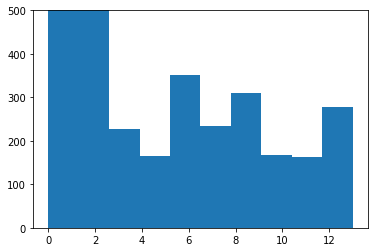

In [16]:
#of sectors agreeing based on bins set to integer value of rp (no rounding)
# type(mydict.values())
# res = sum(mydict.values(), [])
from itertools import chain
res = list(chain(*mydict.values()))
len(res)
plt.hist(res);
plt.ylim(0,500)

In [90]:
len(ticlist),len(mydict.keys())
seen, uniqs = uniquefinder(ticlist)

repeated=[]
count=0
for tic in seen:#.values():
#     print(val)
#     break
    if seen[tic] != 1:
        print(tic,seen[tic])
        repeated.append(tic)
        count +=1
print(repeated)

there are 1485 unique tics. Use the first output dictionary to see number of occurances for duplicates
176954188 2
29986808 2
300293197 2
32088889 2
348898049 2
350146388 2
55745413 2
139370701 2
176934407 2
260351274 2
260352274 2
293225895 2
293935874 2
349642881 2
382198673 2
[176954188, 29986808, 300293197, 32088889, 348898049, 350146388, 55745413, 139370701, 176934407, 260351274, 260352274, 293225895, 293935874, 349642881, 382198673]


(2, 13)

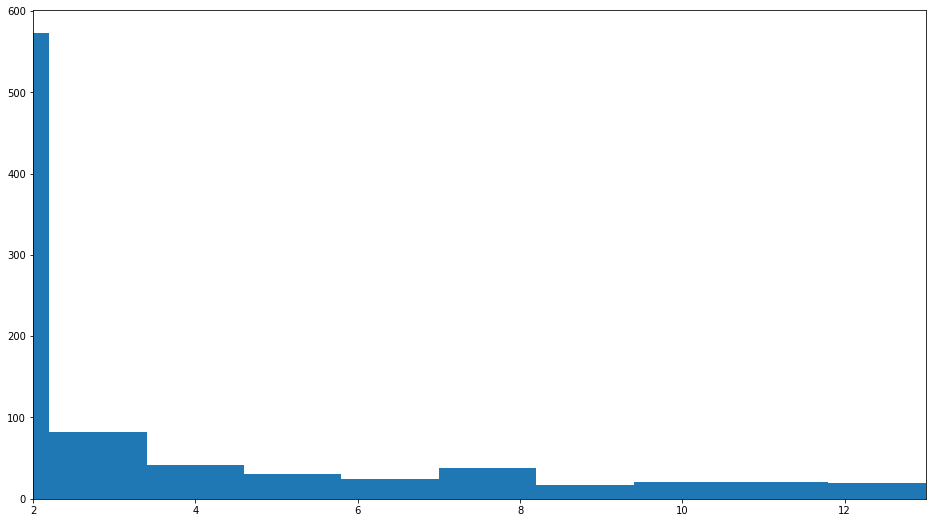

In [54]:
plt.figure(figsize=(16,9))
plt.hist(matches_seen.values())
plt.xlim(2,13)

In [47]:
#get allstats table of only rps that also had sector matches


#get indices
idxs2 = []
for i in matches_uniq:
    indices = np.where(allstats['ID']==i)
    idxs2.append(indices[0])
idxs2 = np.concatenate(idxs2)
matched_rps_table = allstats[idxs2]
matched_rps_table[0:5]

ID,TOTsecs,rvar,ls1,ls2,ls3,lsamp1,lsamp2,lsamp3,acf1,acf2,acf3,acfamp1,acfamp2,acfamp3,version,HIP,TYC,UCAC,TWOMASS,SDSS,ALLWISE,GAIA,APASS,KIC,objType,typeSrc,ra,dec,POSflag,pmRA,e_pmRA,pmDEC,e_pmDEC,PMflag,plx,e_plx,PARflag,gallong,gallat,eclong,eclat,Bmag,e_Bmag,Vmag,e_Vmag,umag,e_umag,gmag,e_gmag,rmag,e_rmag,imag,e_imag,zmag,e_zmag,Jmag,e_Jmag,Hmag,e_Hmag,Kmag,e_Kmag,TWOMflag,prox,w1mag,e_w1mag,w2mag,e_w2mag,w3mag,e_w3mag,w4mag,e_w4mag,GAIAmag,e_GAIAmag,Tmag,e_Tmag,TESSflag,SPFlag,Teff,e_Teff,logg,e_logg,MH,e_MH,rad,e_rad,mass,e_mass,rho,e_rho,lumclass,lum,e_lum,d,e_d,ebv,e_ebv,numcont,contratio,disposition,duplicate_id,priority,eneg_EBV,epos_EBV,EBVflag,eneg_Mass,epos_Mass,eneg_Rad,epos_Rad,eneg_rho,epos_rho,eneg_logg,epos_logg,eneg_lum,epos_lum,eneg_dist,epos_dist,distflag,eneg_Teff,epos_Teff,TeffFlag,gaiabp,e_gaiabp,gaiarp,e_gaiarp,gaiaqflag,starchareFlag,VmagFlag,BmagFlag,splists,e_RA,e_Dec,RA_orig,Dec_orig,e_RA_orig,e_Dec_orig,raddflag,wdflag,objID
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,str12,str10,str16,str1,str19,str19,str8,int64,str4,str10,float64,float64,str10,float64,float64,float64,float64,str6,float64,float64,str5,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str19,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,str5,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,float64,float64,float64,float64,float64,float64,int64,float64,str5,str1,float64,float64,float64,str8,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str6,float64,float64,str6,float64,float64,float64,float64,int64,str1,str8,str8,str15,float64,float64,float64,float64,float64,float64,int64,int64,int64
25078120,10,0.010072106122970714,0.8232321735522494,0.8267494482632384,0.8196249686490314,0.03907265682657143,0.003259892423562739,0.002943846086334601,0.8236117700000001,0.41111144,1.64583465,0.7190724614444489,0.6810679345806819,0.6529038527698448,20190415,--,9153-01453-1,104-003505,04004029-6917235,N,J040040.30-691723.3,4666636968180026880,32010246,--,STAR,tmgaia2,60.1678453464816,-69.2898266914584,tmgaia2,13.412,0.0576847,7.32952,0.0586496,gaia2,1.32575,0.0305187,gaia2,283.161053293861,-39.7863266827584,332.749187376131,-78.586656423285,11.675,0.161,11.309,0.011,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,10.148,0.025,9.936,0.027,9.845,0.023,AAA-222-111-000-0-0,nan,9.813,0.022,9.823,0.02,9.766,0.032,9.571,nan,11.0298,0.000582,10.6754,0.006,rered,gaia2,6647.0,127.413,3.54683,0.0963075,nan,nan,3.3013,0.156714,1.4,0.252472,0.0389111,0.0100469,DWARF,19.1675682,1.21977,738.335,16.7655,0.0874817,0.009484905,78,0.00772595825,N/A,N,0.0009275428,0.00934841,0.0096214,schlegel,0.183568,0.321375,0.166818,0.14661,0.00922242,0.0108714,0.0949253,0.0976897,1.24047,1.19907,16.392,17.139,bj2018,108.141,146.685,dered,11.3027,0.001534,10.626,0.001066,1,N,tycho2v3,tycho2b3,N/A,1.08730370622707,0.909516365728523,60.1680086367179,-69.2897951338796,0.0326031319210215,0.028529570529201,1,0,523673578
25078674,13,0.0007094740867614746,0.8945809857057054,0.8889440039682857,5.924223681965535,0.0026819310899522794,0.0013493057821621656,0.0012712490419775917,0.0694445,0.47083371,0.6527783,0.1048037370866115,0.035125713919498945,0.03488179985900459,20190415,18729,9156-01126-1,095-003887,04004364-7110004,N,J040043.72-711000.2,4665895622465095552,33558531,--,STAR,tmgaia2,60.1820071100849,-71.1667980904251,tmgaia2,24.3648,0.0910099,34.4321,0.076929,gaia2,9.40915,0.0409054,gaia2,285.207689084308,-38.7794527367004,323.330040288627,-78.4557249248621,6.675,0.023,6.6,0.03,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,6.399,0.018,6.442,0.027,6.347,0.017,AAA-111-111-000-0-0,nan,6.358,0.095,6.253,0.026,6.381,0.015,

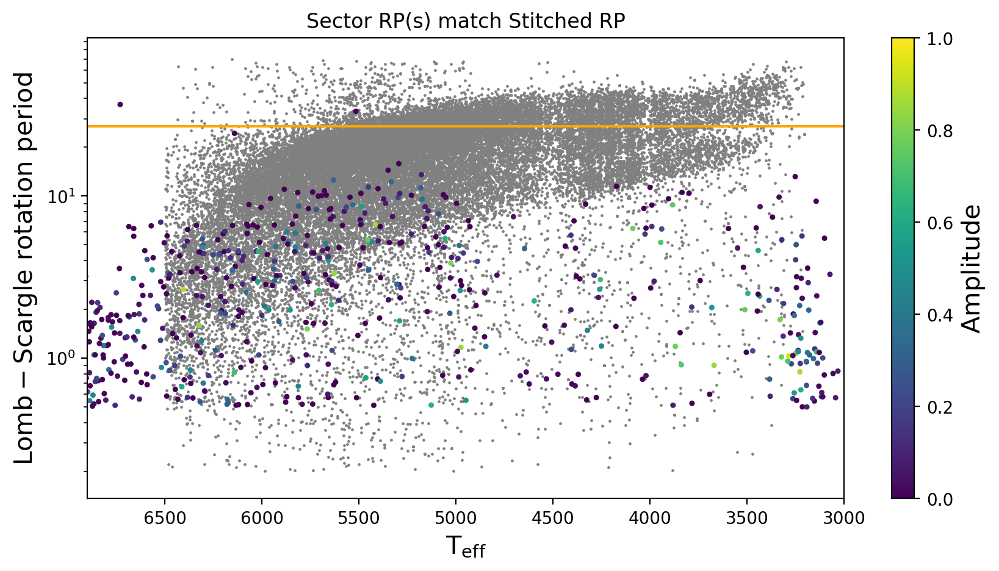

In [48]:
#plot 

plt.figure(figsize=(10,5),dpi=200)
plt.scatter(matched_rps_table['Teff'],matched_rps_table['ls1'],s=5,c=matched_rps_table['lsamp1'],vmax=1,vmin=.0001, rasterized=True);
plt.scatter(mq['TEMP'],mq['ROTATION_PERIOD'],s=.5,vmax=1,vmin=.0001,zorder=0,color = 'grey', rasterized=True)#label='mcquillan is blue');
plt.xlabel('$\mathrm{T_{eff}}$',fontsize=15);
plt.ylabel("$\mathrm{Lomb-Scargle~rotation~period}$",fontsize=15);
plt.colorbar().set_label(label='$\mathrm{Amplitude}$',size=15)
plt.title('Sector RP(s) match Stitched RP'.format(fontsize=20))
plt.axhline(27,color='orange')
plt.yscale('log')
plt.xlim(6900,3000);

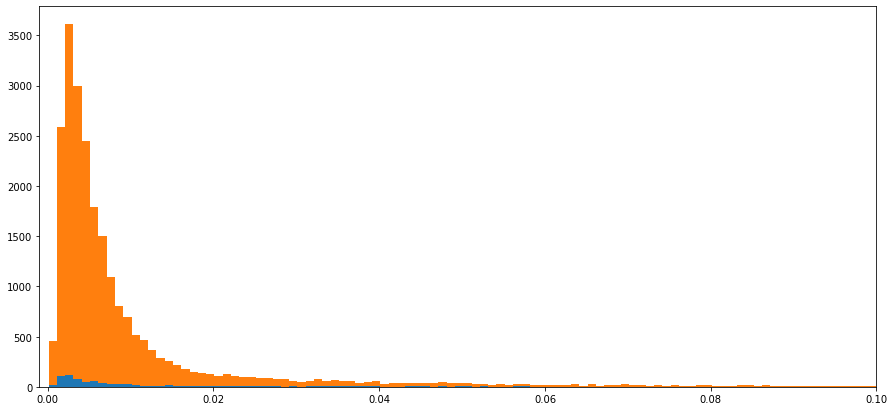

In [49]:
plt.figure(figsize=(15,7))
plt.hist(matched_rps_table['rvar'],bins=np.linspace(0.0001,1,1000),zorder=1);
plt.hist(allstats['rvar'],bins=np.linspace(0.0001,1,1000),zorder=0)
plt.xlim(-.001,.1);

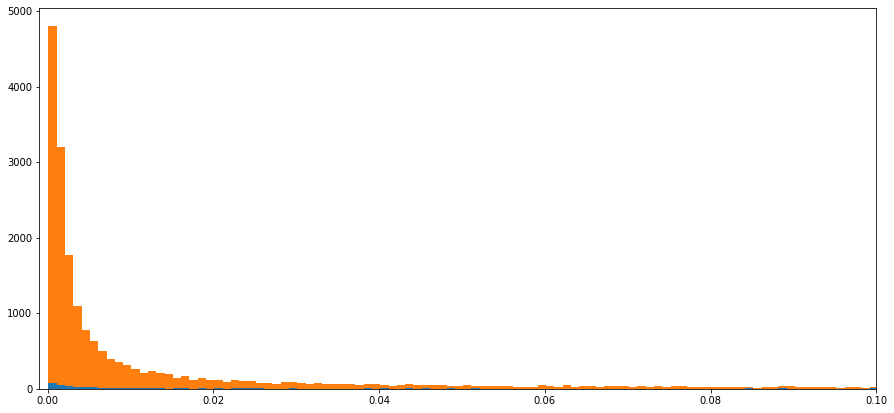

In [50]:
plt.figure(figsize=(15,7))
plt.hist(matched_rps_table['lsamp1'],bins=np.linspace(0.0001,1,1000),zorder=1);
plt.hist(allstats['lsamp1'],bins=np.linspace(0.0001,1,1000),zorder=0)
plt.xlim(-.001,.1);

Average LS1 Rotation Period for TIC 25078120 is: 0.8230967689051971
Highest Amplitude from sector: 4
verify: 25078120 matches: 25078120
Stitched RP:  0.8232321735522494
Average LS1 Rotation Period for TIC 25078674 is: 2.1779133877613783
Highest Amplitude from sector: 4
verify: 25078674 matches: 25078674
Stitched RP:  0.8945809857057054
Average LS1 Rotation Period for TIC 25081629 is: 1.4637953294515345
Highest Amplitude from sector: 13
verify: 25081629 matches: 25081629
Stitched RP:  0.5449752992925279
Average LS1 Rotation Period for TIC 25117273 is: 3.0096406186866513
Highest Amplitude from sector: 4
verify: 25117273 matches: 25117273
Stitched RP:  0.6951369815877226
Average LS1 Rotation Period for TIC 25117406 is: 2.849457056581449
Highest Amplitude from sector: 9
verify: 25117406 matches: 25117406
Stitched RP:  1.3923419314092091
Average LS1 Rotation Period for TIC 25118964 is: 1.018194198065789
Highest Amplitude from sector: 7
verify: 25118964 matches: 25118964
Stitched RP:  1.0181

10

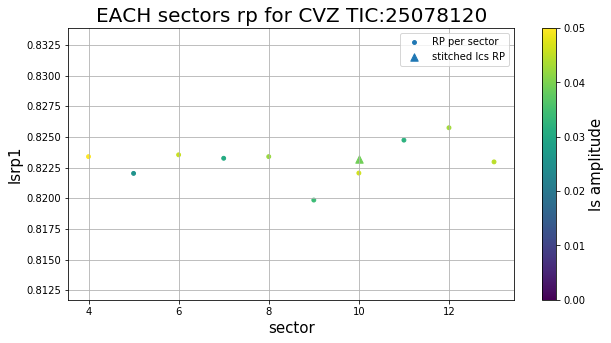

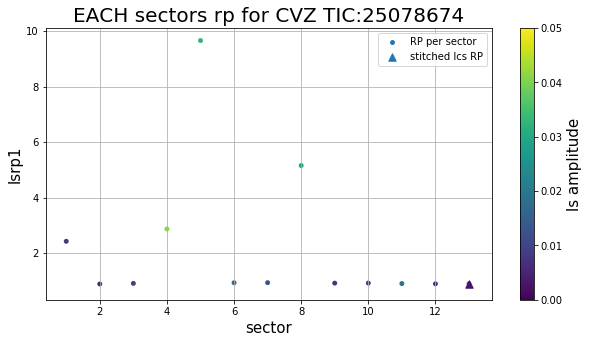

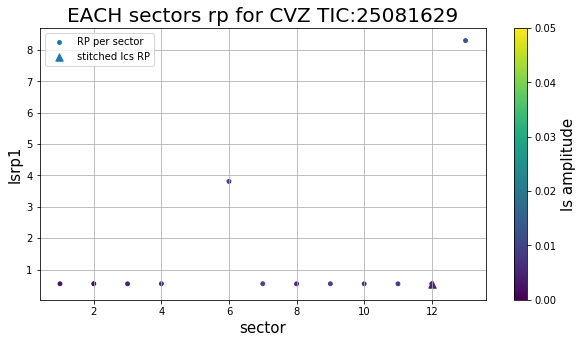

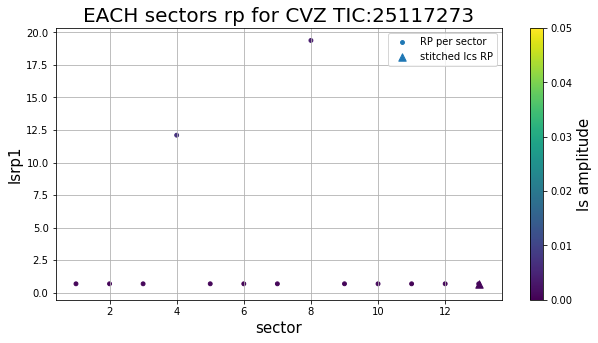

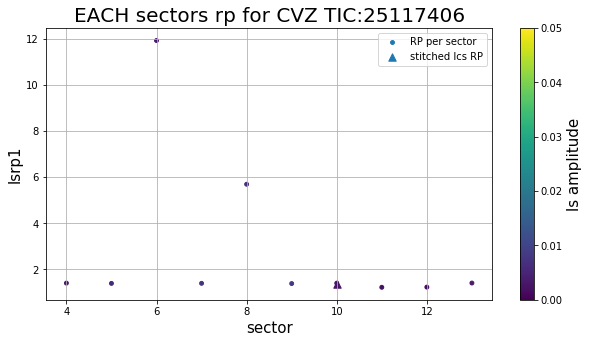

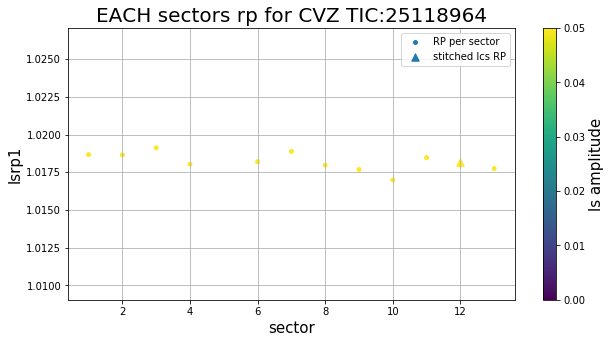

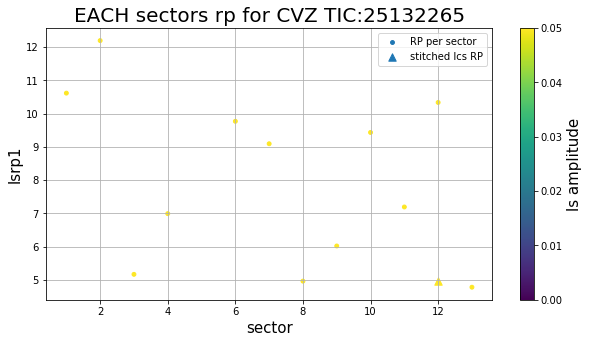

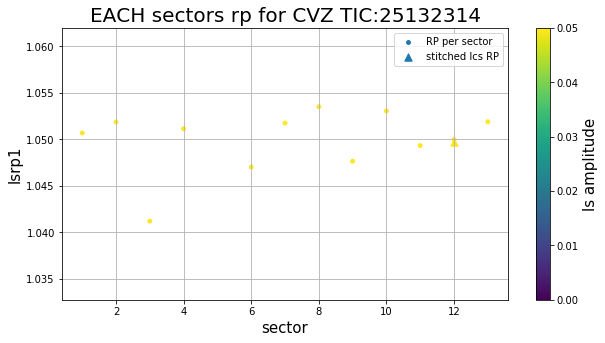

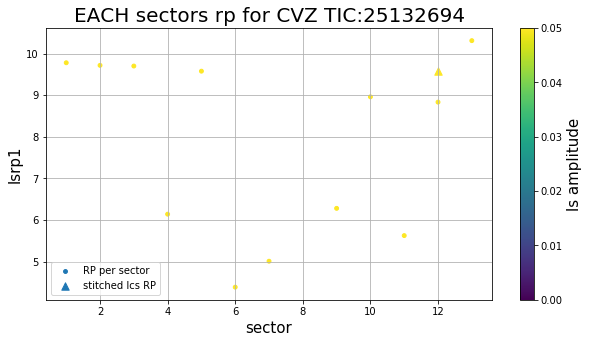

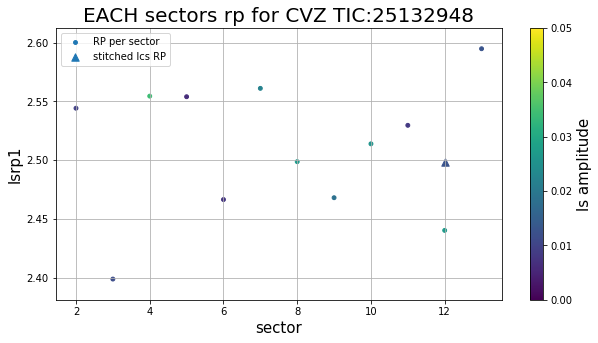

In [51]:
#loop over multiple tics
ticids = matched_rps_table['ID']
tabs = []
for i in ticids[0:10]:
    si = str(i) ### this fixed to loop correctly
    tab = plot_rps(si)
    tabs.append(tab)
#     print(i)
#print(ticids)
len(tabs)

In [1]:

tic = 25132314 #25132265
myt = plot_rps(tic,plot=True)
limit = 20
shortmyt = myt[myt['lsrp1']<limit]
avg = np.mean(shortmyt['lsrp1'])
print('Mean of rps less than', limit,'is: ',avg)
myt

NameError: name 'plot_rps' is not defined

# how many sectors, per star, are close in rp?

In [9]:
uniquefinder(cvzsecs['ID']); len(goodtics) #THESE DONT MATCH --NOT GOOD

there are 5995 unique tics. Use the first output dictionary to see number of occurances for duplicates


6009

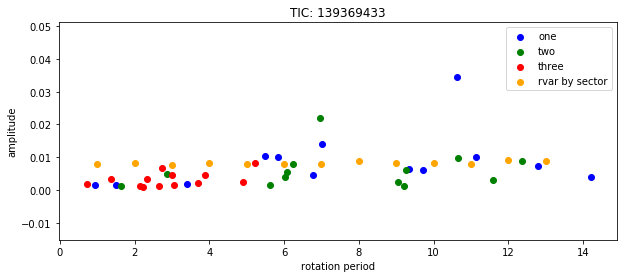

In [10]:
#not sure how this could be helpful

seen = {}
count = 0
for tic in goodtics:
    if tic not in seen:
        seen[tic] = count
        onestar_table = cvzsecs[cvzsecs['ID']==tic]
        plt.figure(figsize=(10,4))
        plt.scatter(onestar_table['ls1'],onestar_table['lsamp1'],color='b',label='one')
        plt.scatter(onestar_table['ls2'],onestar_table['lsamp2'],color='green',label='two')
        plt.scatter(onestar_table['ls3'],onestar_table['lsamp3'],color='red',label='three')
        plt.scatter(onestar_table['sector'],onestar_table['rvar'],label='rvar by sector',color='orange')
        plt.xlabel('rotation period')
        plt.ylabel('amplitude')
        plt.title('TIC: {}'.format(tic))
        plt.legend()
    else:
        pass
    break

In [11]:
seen = {}
consistent10={}
consistent6={}
consistent5={}
consistent4={}
consistent3={}
count = 0
cadence = 27 #days
bins = np.arange(0,cadence+1,1)
for tic in goodtics:
#     print(tic)
    count += 1
    if tic not in seen:
        seen[tic] = count
        onestar_table = cvzsecs[cvzsecs['ID']==tic]
        rps = onestar_table['ls1']
        hist = np.histogram(rps,bins)
#         print(hist)
#         print(hist[1])
        repeats3=[]
        repeats4=[]
        for idx,num in enumerate(hist[0]):
            if num ==6: ## num of sectors with integer values of rps matching (this isnt as meaningful for short rps)
#                 repeats6.append(idx)
                #limited by number of sectors --- wont have repeats
                consistent6[tic] = idx
            if num >=10:
                #limited by number of sectors --- wont have repeats
                consistent10[tic] = idx #idx starts with 0..ie rp starts with 0.rpvalue
            if num ==3:
                repeats3.append(idx)
                consistent3[tic] = repeats3
            if num ==4:
                repeats4.append(idx)
                consistent4[tic] = repeats4
#         break

            
    else:
        pass
#     if count == 3:
#         print(count)
#         break
#this part concatenates dictionary values to account for any repeats in teh number of sector agreements
threes = sum(consistent3.values(), [])
fours = sum(consistent4.values(), [])




In [12]:
# len(consistent2),len(list(consistent2.values())[0]),len(consistent2.values()),consistent2, twos
# onestar_table = cvzsecs[cvzsecs['ID']==141809359]
# np.histogram(onestar_table['ls1'],bins),'next',len(np.histogram(onestar_table['ls1'],bins)[0]),len(bins[:-1]),bins[:-1]

total sample with exactly 6 sectors starting with same rp integer is of size 343


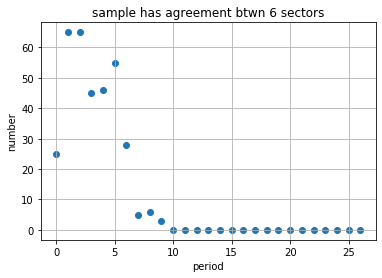

In [13]:
# len(list(consistent.values())),len(bins),len(x),consistent.values() #converts dict values to a list
x = np.histogram(list(consistent6.values()),bins)[0]
y = bins[:-1]
plt.scatter(y,x)
plt.grid('on')
plt.xlabel('period')
plt.ylabel('number')
plt.title('sample has agreement btwn 6 sectors');
print('total sample with exactly 6 sectors starting with same rp integer is of size {}'.format(np.sum(x)))

total sample with 10 or more sectors starting with same rp integer is of size 606


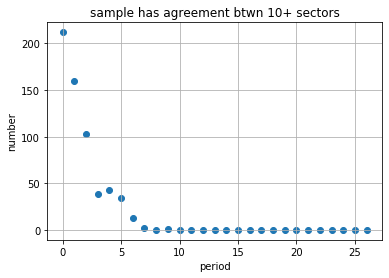

In [14]:
x = np.histogram(list(consistent10.values()),bins)[0]
y = bins[:-1]
plt.scatter(y,x)
plt.grid('on')
plt.xlabel('period')
plt.ylabel('number')
plt.title('sample has agreement btwn 10+ sectors');
print('total sample with 10 or more sectors starting with same rp integer is of size {}'.format(np.sum(x)))

total sample with exactly 3 sectors starting with same rp integer is of size 3749


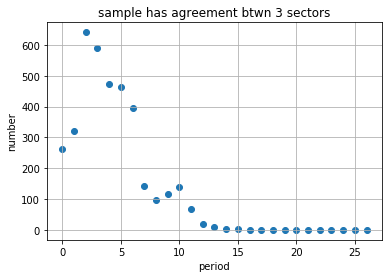

In [16]:
x = np.histogram(threes,bins)[0]
# len(twos),twos,consistent2
y = bins[:-1]
plt.scatter(y,x)
plt.grid('on')
plt.xlabel('period')
plt.ylabel('number')
plt.title('sample has agreement btwn 3 sectors');
print('total sample with exactly 3 sectors starting with same rp integer is of size {}'.format(np.sum(x)))

In [ ]:
#remix

seen = {}
consistent10={}
consistent9={}
consistent8={}
consistent7={}
consistent6={}
consistent5={}
consistent4={}
consistent3={}
consists =[]
count = 0
cadence = 27 #days
agreement = np.arange(3,11,1)
bins = np.arange(0,cadence+1,1)
for tic in goodtics:
#     print(tic)
    count += 1
    if tic not in seen:
        seen[tic] = count
        onestar_table = cvzsecs[cvzsecs['ID']==tic]
        rps = onestar_table['ls1']
        hist = np.histogram(rps,bins)
#         print(hist)
#         print(hist[1])
        repeats3=[]
        repeats4=[]
        for idx,num in enumerate(hist[0]):
            if num ==3:
                repeats3.append(idx)
                consistent3[tic] = repeats3
            elif num ==4:
                repeats4.append(idx)
                consistent4[tic] = repeats4
            elif num ==5:
                consistent5[tic] = idx
            elif num ==7:
                consistent7[tic] = idx
            elif num ==8:
                consistent8[tic] = idx
            elif num ==9:
                consistent9[tic] = idx
            elif num ==6: 
                consistent6[tic] = idx
            elif num >=10:
                consistent10[tic] = idx #idx starts with 0..ie rp starts with 0.rpvalue
            else:
                pass
#         break

            
    else:
        pass
#     if count == 3:
#         print(count)
#         break
#this part concatenates dictionary values to account for any repeats in teh number of sector agreements
threes = sum(consistent3.values(), [])
fours = sum(consistent4.values(), [])
consists.append(threes,)




[(0, 0), (0, 1), (1, 0), (1, 1), (2, 0), (2, 1), (3, 0), (3, 1)]


NameError: name 'number' is not defined

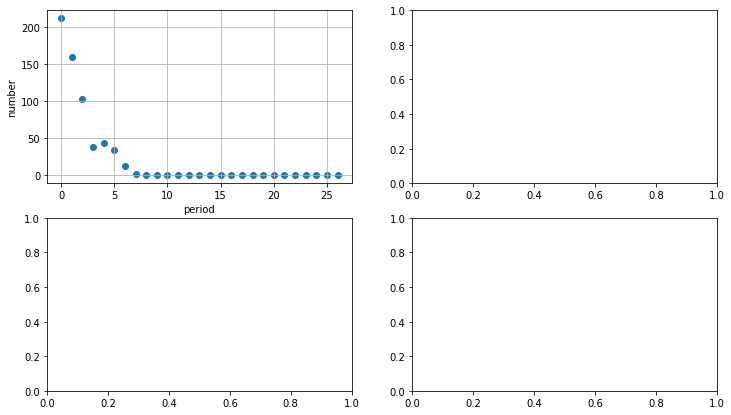

In [69]:
f, axs = plt.subplots(2, 2,figsize=(12,7))
rc = [(i,j) for i,j in tups]
print(rc)
x = np.histogram(list(consistent10.values()),bins)[0]
y = bins[:-1]
for tup in tups:
    axs[tup].scatter(y,x)
    axs[0,0].grid('on')
    axs[0,0].set_xlabel('period')
    axs[0,0].set_ylabel('number')
    axs[0,0].set_title('sample has agreement btwn {} sectors'.format(number));

In [65]:
#makes tuples for my plotting axes
xxx=np.repeat(np.arange(0,4,1),3)
mine= [0,0,1,1,0,0,1,1,0,0,1,1]
tups=[]
seen={}
for val in xxx:
    for num in mine:
        tup = (val,num)
#         print(tup)
        if tup not in seen:
            seen[tup]= 0
            print('yup',tup)
            tups.append(tup)
        else:
            pass
tups

yup (0, 0)
yup (0, 1)
yup (1, 0)
yup (1, 1)
yup (2, 0)
yup (2, 1)
yup (3, 0)
yup (3, 1)


[(0, 0), (0, 1), (1, 0), (1, 1), (2, 0), (2, 1), (3, 0), (3, 1)]

In [67]:
for i in tups:
    print(i)
    break


(0, 0)


# tests 

In [98]:
# test_dict = {"Gfg" : [4, 5], "is" : [6, 8], "best" : [10]}

# res = sum(test_dict.values(), [])
# res

[4, 5, 6, 8, 10]

In [61]:
# # First create some toy data:
# x = np.linspace(0, 2*np.pi, 400)
# y = np.sin(x**2)

# # Create just a figure and only one subplot
# fig, ax = plt.subplots()
# ax.plot(x, y)
# ax.set_title('Simple plot')

# # Create two subplots and unpack the output array immediately
# f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
# ax1.plot(x, y)
# ax1.set_title('Sharing Y axis')
# ax2.scatter(x, y)

# # Create four polar axes and access them through the returned array
# fig, axs = plt.subplots(2, 2, subplot_kw=dict(polar=True))
# axs[0, 0].plot(x, y)
# axs[1, 1].scatter(x, y)

# # Share a X axis with each column of subplots
# plt.subplots(2, 2, sharex='col')

# # Share a Y axis with each row of subplots
# plt.subplots(2, 2, sharey='row')

# # Share both X and Y axes with all subplots
# plt.subplots(2, 2, sharex='all', sharey='all')

# # Note that this is the same as
# plt.subplots(2, 2, sharex=True, sharey=True)

# # Create figure number 10 with a single subplot
# # and clears it if it already exists.
# fig, ax = plt.subplots(num=10, clear=True)

In [ ]:
# # Plots highest amp RP of each sector for ALL SECTORS
# def plotall_rps(tic):
#     if type(tic)==np.int:
#         tic=np.dtype([(tic, np.str_, 16)])
#         print('tic',type(tic))
#     else: #if a numpy string
#         #tic=tic
#         tic=np.array2string(tic) #makes numpy string into a python string
#         #print('tic2:',type(tic),tic)
#     secs=[]
#     rps=[]
#     amps=[]
#     rvars=[]
#     ids=[]
#     for count,row in enumerate(cvzsecs):
#         ticids = str(row['ID']) #integer made into a string to match tic
#         ids.append(ticids)
#     for ticid in ids:
#         #print('type:',type(ticid))
#         #ticid = ticid.dtype(type(tic))
#         #print(type(ticid),ticid, tic,type(tic))
#         #ticid = str(ticid) #this repeats above tho...
#         if ticid == tic:
#             print('do i ever go here')
#             sec = row['sector']
#             rp = row['ls1']
#             amp = row['lsamp1']
#             rvar = row['rvar']
#             secs.append(sec)
#             rps.append(rp)
#             amps.append(amp)
#             rvars.append(rvar)
#         else:
#             #print('chose didnt match')
#             continue
#         #break
#     print('len:',len(secs))
# #     mytable=1
#     #summary stats
#     mytics = np.repeat(tic,len(secs))
#     mytable = Table([mytics,secs,rps,amps,rvars],names=('ID','sector','lsrp1','lsamp1','rvar'))
# #         #comparison from stitiched lc
# #         ogt = Table.read('data/THIRDRUN/big_stats_3rdrun.fits')#id uses strings
# #         ogtt = ogt[ogt['ID']==str(tic)] #must be a string
# #         #plotting
# #         plt.figure(figsize=(10,5))
# #         plt.scatter(mytable['sector'],mytable['lsrp1'],s=15,c=mytable['lsamp1'],vmax=0.05,vmin=0.0);   
# #         plt.scatter(ogtt['TOTsecs'],ogtt['ls1'],s=55,c=ogtt['lsamp1'],vmax=0.05,vmin=0.0)
# #         plt.xlabel('sector')
# #         plt.ylabel('lsrp1')
# #         plt.colorbar().set_label('ls amplitude')
# #         plt.grid('on')
# #         plt.title('TIC:{}'.format(tic))
#     return mytable

In [ ]:
# #runs above fcn
# for i in goodtics[0:2]:
#     myt = plotall_rps(i)

In [ ]:
# len(cvzstats['ls1']),len(uniqs),len(cvzsecs)

In [ ]:
# 8.192019582399434+5.682271476643926+1.0013969627326391+12.519436619718313+2.8952237016963283+ \
# 5.796398313926798+3.240152107221593+2.3206513112275164+6.6225994492591225+3.1100599003526836+\
# 6.355098492301358+2.0334324031507127+2.4702529169038128

In [ ]:
# test = cvzsecs[(cvzsecs['ID']==uniqs[0])]
# test

# mq sample for marta

In [ ]:
# mq = pd.read_csv('data/mcquillanwithRADEC.csv')
# mq

In [ ]:
# mytab.dtypes,'space', mq.dtypes

In [ ]:
# kep = Table.read('data/kepler_dr2_1arcsec.fits')
# # kep.colnames
# # type(kep)
# # print(type(kic[0]),type(mq['ID'][0]),type(kep['kepid']))
# ids=[]
# for i in kep['kepid']:
#     ids.append(i)
# ids=np.array(ids)
# kep

In [ ]:
# lats=[]
# longs=[]
# mags =[]
# for row in kep:
#     lat = row['b']
#     long = row['l']
#     mag = row['phot_g_mean_mag']
#     lats.append(lat)
#     longs.append(long)
#     mags.append(mag)
    

In [ ]:
# plt.scatter(np.arange(0,len(kep),1),kep['phot_g_mean_mag'],s=1) #Gband (green) avg mag



In [ ]:
# #plt.scatter(np.arange(0,len(kep),1),kep['phot_g_mean_mag'],s=1) #Gband (green) avg mag
# #kep['kepmag'] #practically same as gband mag
# planets=[]
# for val in kep['planet?']:
#     if val == 'none':
#         p = 0
#     elif val == 'conf':
#         p = 1
#     else:
#         p = 99
#     planets.append(p)
# #kic = np.array(kep['kepid'])
# #mytab = Table([kic,planets],names=('ID','PLANETS'))
# mytab = pd.DataFrame({'ID':ids,'Magnitude_g':mags,'Planets':planets,'Galactic_Latitude':lats,'Galactic_Longitude':longs})
# print(type(mytab))
# #plt.scatter(np.arange(0,len(kep),1),planets,s=1)
# plt.scatter(kep['mass'],planets,s=.5)


In [ ]:
# mytab

In [ ]:
# newt = pd.merge(mq, mytab, on='ID')#, on=None) #join(mq,mytab)
# #newt = mq.join(mytab, on=['ID'])
# # dfs = [mq,mytab]
# # newt = pd.concat(dfs)
# print(len(mq),len(mytab),len(newt))
# newt

In [ ]:
#newt.to_csv('data/mcquillan_sample.csv', index=False) #already ran

In [ ]:
# testing = pd.read_csv('data/mcquillan_sampletest.csv')
# testing

In [ ]:
# testing = pd.read_csv('data/mcquillan_sample.csv')
# testing[testing['Planets']==1] #maza et al with mcquillan for more confirmed planets